# 数据挖掘 第12周课后作业 离群点分析与异常检测

> 本作业 GitHub 地址：[GitHub Address](https://github.com/Nonsensersunny/bit-data-mining/blob/master/homework-8/wine.ipynb)

> 所选取数据集：[wine_benchmarks](https://ir.library.oregonstate.edu/concern/parent/47429f155/file_sets/9p290g47x)

## 1. 准备工作

In [1]:
# 导入相关依赖
import os
import sys
sys.path.append('../')
import csv
import numpy as np
np.set_printoptions(threshold=np.inf)

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.font_manager
from pyod.models.knn import KNN   
from pyod.models.abod import ABOD
from pyod.models.cblof import CBLOF
from pyod.models.feature_bagging import FeatureBagging
from pyod.models.hbos import HBOS
from pyod.models.iforest import IForest
from pyod.models.lof import LOF
from sklearn.preprocessing import MinMaxScaler

# 实验选取的属性
attribute = [
    'diff.score',
    'fixed.acidity',
    'volatile.acidity',
    'citric.acid',
    'residual.sugar',
    'chlorides',
    'free.sulfur.dioxide',
    'total.sulfur.dioxide',
    'density',
    'pH',
    'sulphates',
    'alcohol'
]

# 数据集路径
root = './data/wine/benchmarks/'

## 2. 数据集预处理

In [7]:
# 词典模型
random_state = np.random.RandomState(20)
outliers_fraction = 0.05
classifiers = {
        'Angle-based Outlier Detector (ABOD)': ABOD(contamination=outliers_fraction),
        'Cluster-based Local Outlier Factor (CBLOF)': CBLOF(contamination=outliers_fraction, check_estimator=False, random_state=random_state),
        'Feature Bagging': FeatureBagging(LOF(n_neighbors=35), contamination=outliers_fraction, check_estimator=False, random_state=random_state),
        'Histogram-base Outlier Detection (HBOS)': HBOS(contamination=outliers_fraction),
        'Isolation Forest': IForest(contamination=outliers_fraction, random_state=random_state),
        'K Nearest Neighbors (KNN)': KNN(contamination=outliers_fraction),
        'Average KNN': KNN(method='mean', contamination=outliers_fraction)
}

# 导入数据集
files = os.listdir(root)
path = './data/wine/'

# 异常数据处理
for att in attribute[1:]:
    save_file = path + att + '.txt'
    fout = open(save_file, mode='w')

    for file in files:
        fout.write('\n\ndataset abalone: ' + file + '\n')
        file = root + file

        dataset = pd.read_csv(file)  

        former = attribute[0]
        latter = att
        scaler = MinMaxScaler(feature_range=(0, 1))
        dataset[[former, latter]] = scaler.fit_transform(dataset[[former, latter]])
        dataset[[former, latter]].head()

        X1 = dataset[former].values.reshape(-1, 1)
        X2 = dataset[latter].values.reshape(-1, 1)
        X = np.concatenate((X1, X2), axis=1)

        xx, yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
        for i, (clf_name, clf) in enumerate(classifiers.items()):
            clf.fit(X)
            scores_pred = clf.decision_function(X) * -1

            y_pred = clf.predict(X)
            n_inliers = len(y_pred) - np.count_nonzero(y_pred)
            n_outliers = np.count_nonzero(y_pred == 1)
            plt.figure(figsize=(10, 10))

            dfx = dataset
            dfx['outlier'] = y_pred.tolist()

            IX1 = np.array(dfx[former][dfx['outlier'] == 0]).reshape(-1, 1)
            IX2 = np.array(dfx[latter][dfx['outlier'] == 0]).reshape(-1, 1)

            OX1 = dfx[former][dfx['outlier'] == 1].values.reshape(-1, 1)
            OX2 = dfx[latter][dfx['outlier'] == 1].values.reshape(-1, 1)

            line = 'OUTLIERS: ' + str(n_outliers) + '  INLIERS: ' + str(n_inliers) + ' using ' + clf_name

            fout.write(str(line) + '\n')

    fout.close()

## 3. 异常检测与可视化分析

### 3.1 diff.score, fixed.acidity



dataset wine: wine_benchmark_0941.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


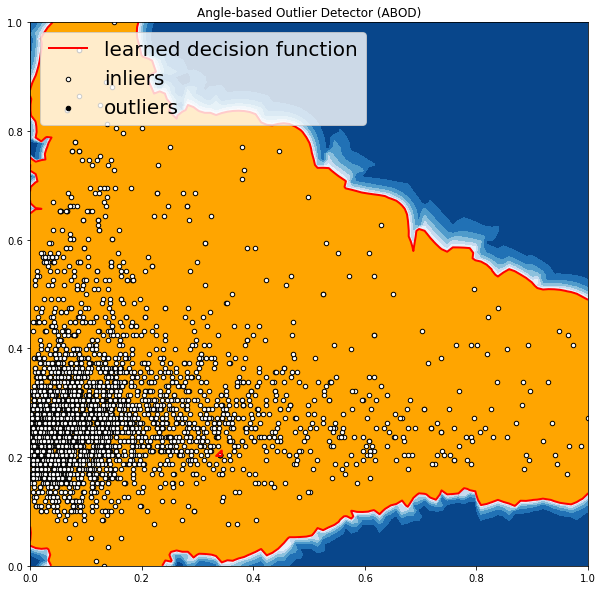

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


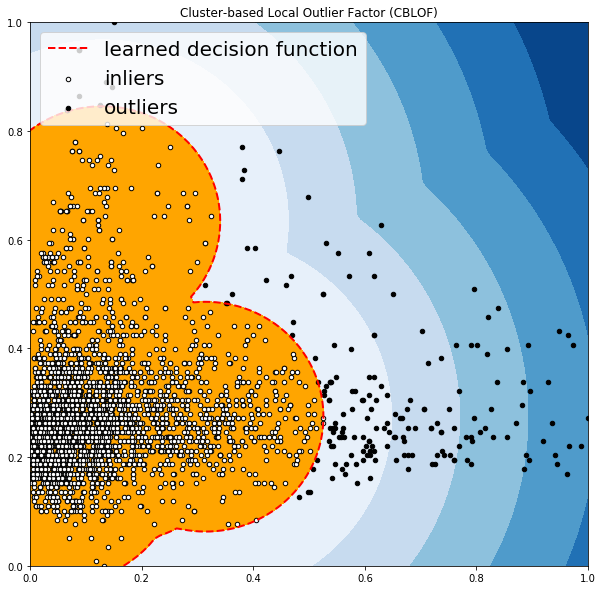

OUTLIERS :  172 INLIERS :  3567 Feature Bagging


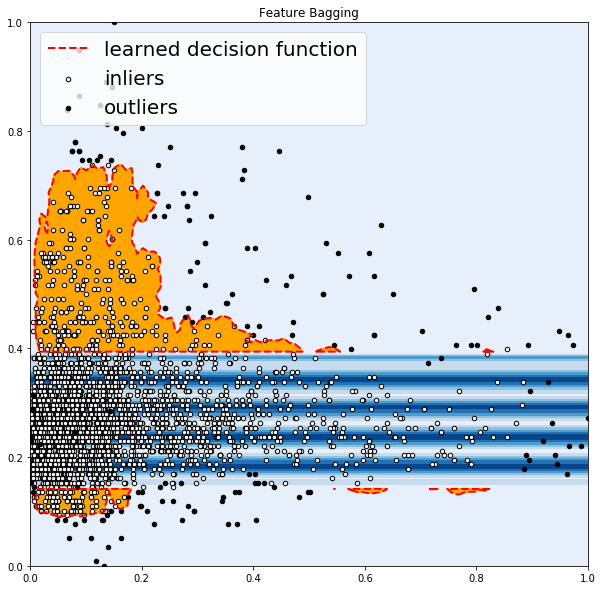

OUTLIERS :  180 INLIERS :  3559 Histogram-base Outlier Detection (HBOS)


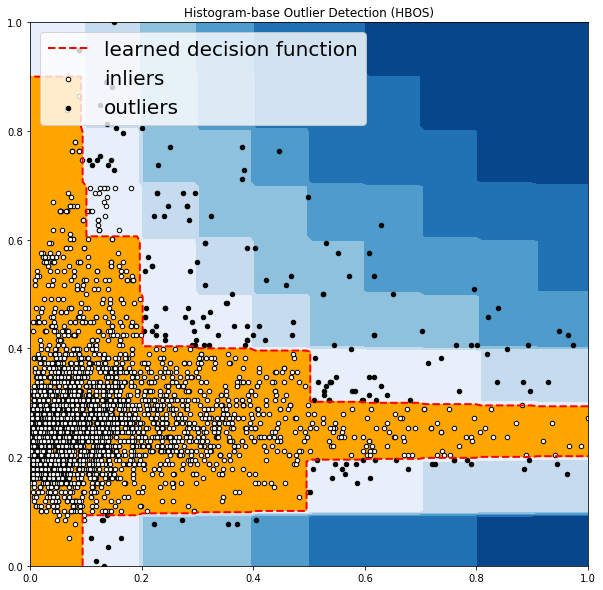

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


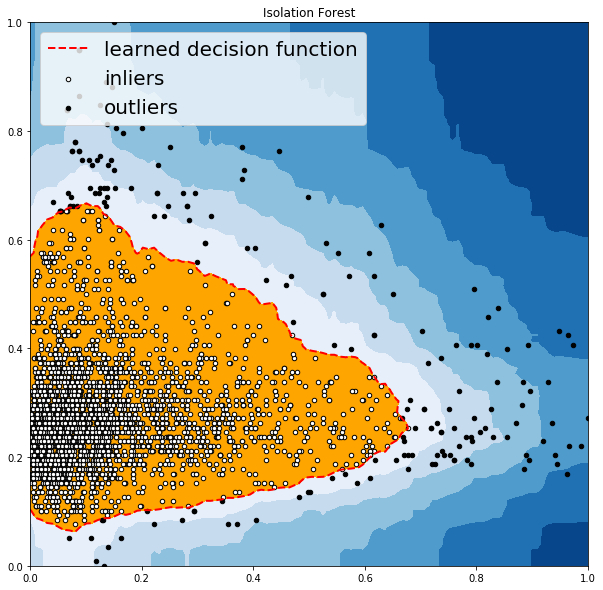

OUTLIERS :  161 INLIERS :  3578 K Nearest Neighbors (KNN)


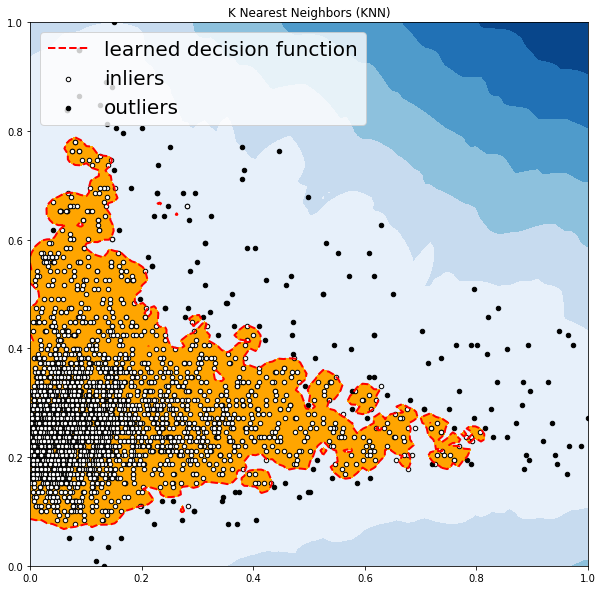

OUTLIERS :  122 INLIERS :  3617 Average KNN


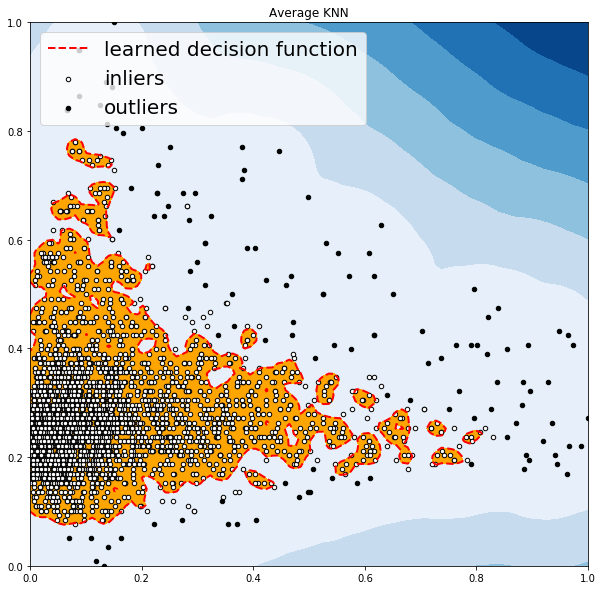



dataset wine: wine_benchmark_0955.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


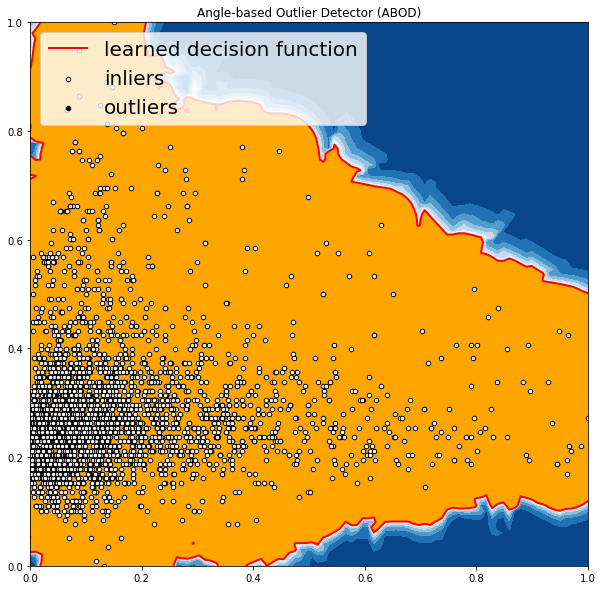

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


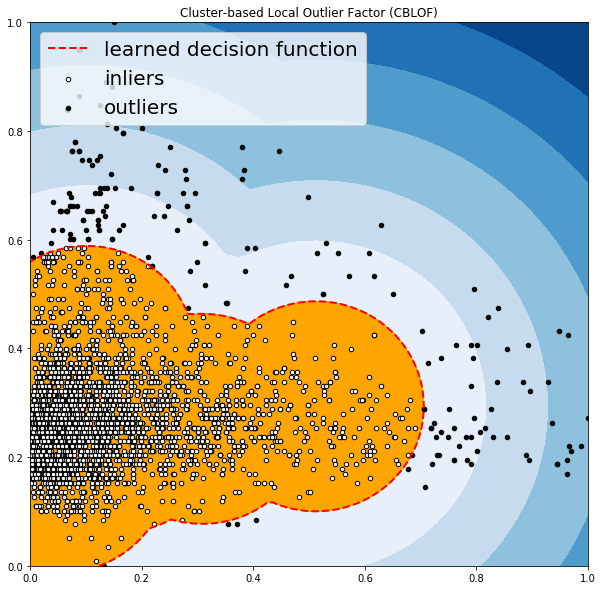

OUTLIERS :  173 INLIERS :  3566 Feature Bagging


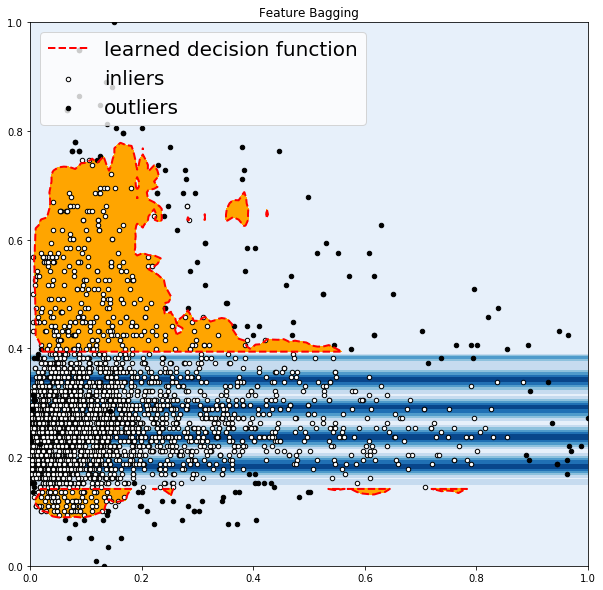

OUTLIERS :  167 INLIERS :  3572 Histogram-base Outlier Detection (HBOS)


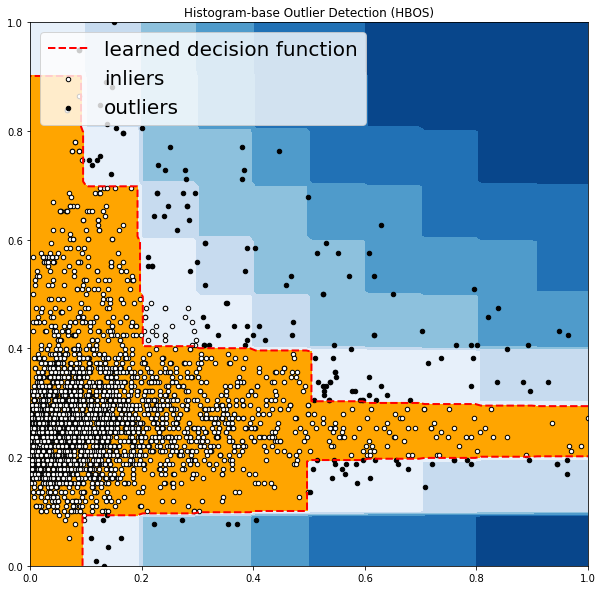

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


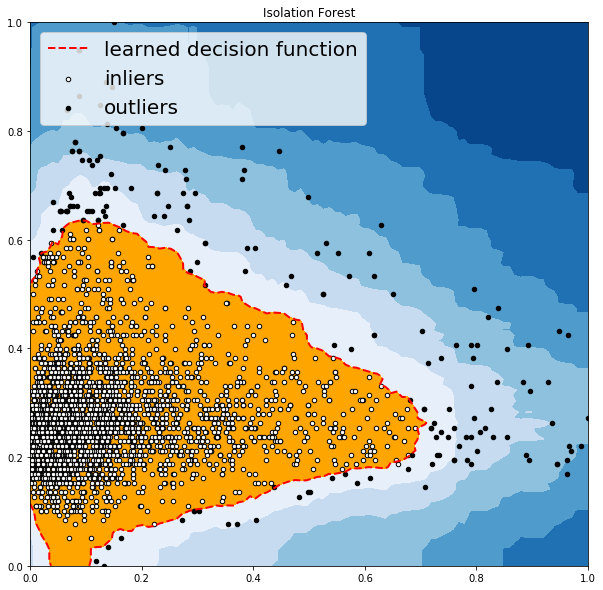

OUTLIERS :  154 INLIERS :  3585 K Nearest Neighbors (KNN)


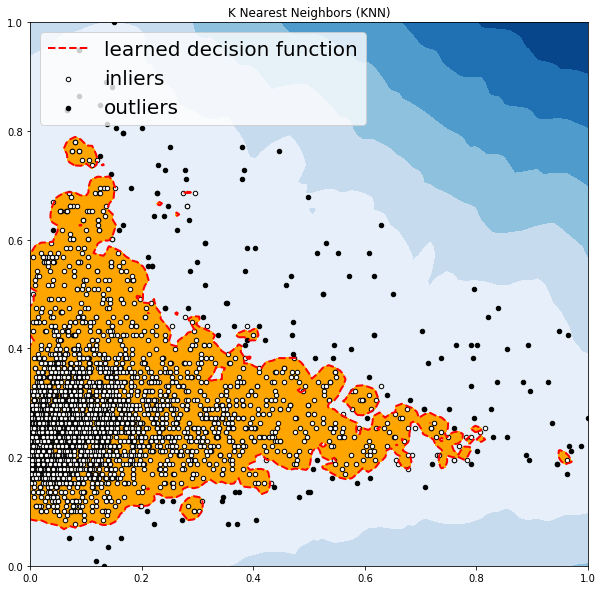

OUTLIERS :  112 INLIERS :  3627 Average KNN


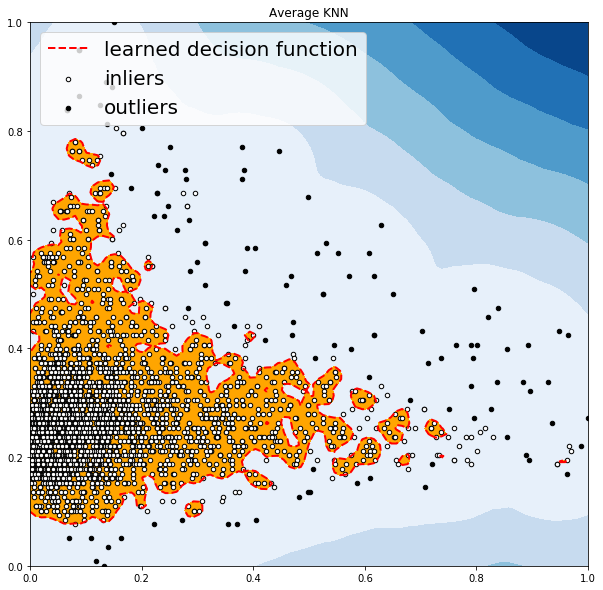



dataset wine: wine_benchmark_0969.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


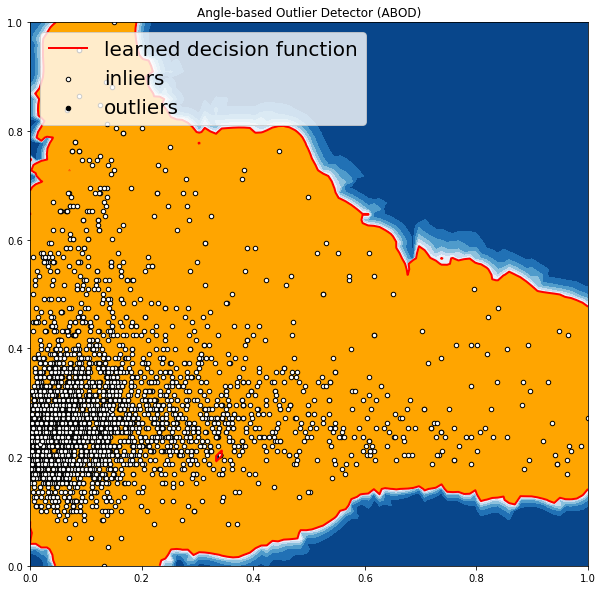

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


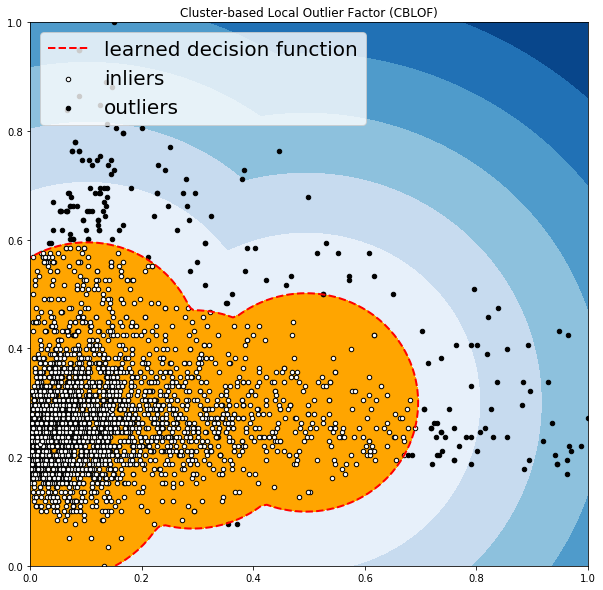

OUTLIERS :  171 INLIERS :  3568 Feature Bagging


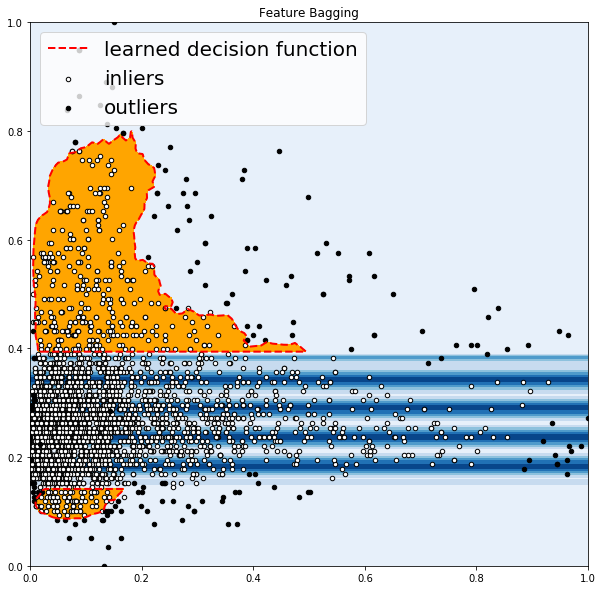

OUTLIERS :  169 INLIERS :  3570 Histogram-base Outlier Detection (HBOS)


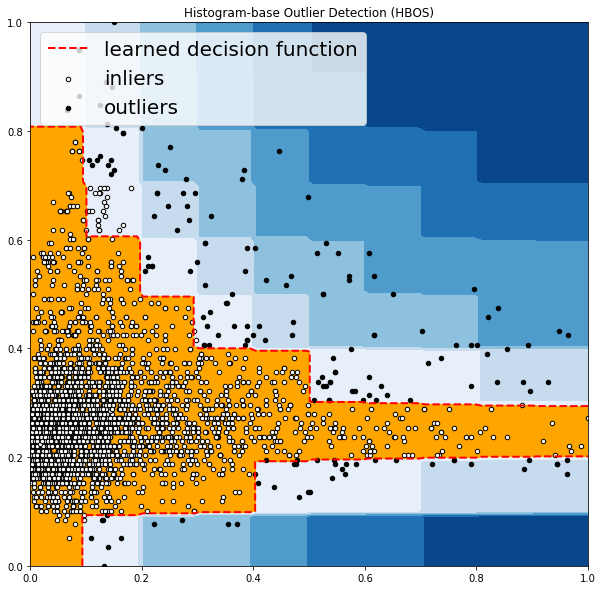

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


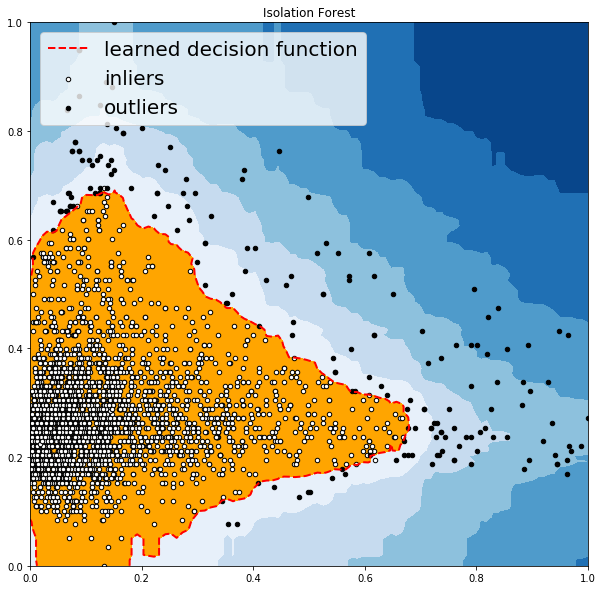

OUTLIERS :  150 INLIERS :  3589 K Nearest Neighbors (KNN)


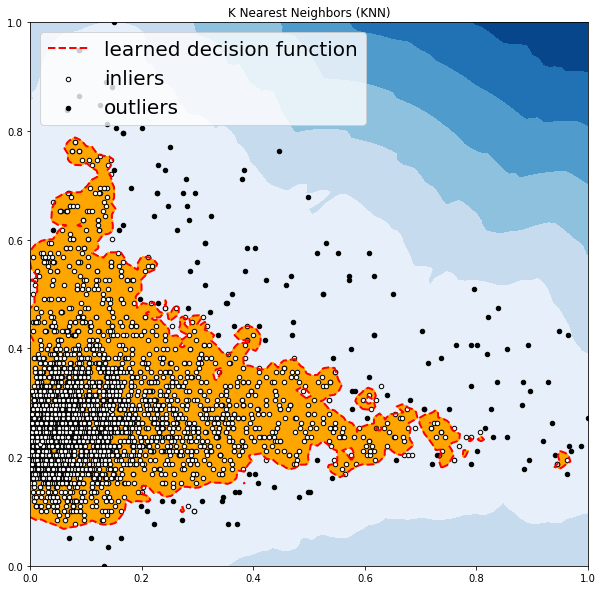

OUTLIERS :  115 INLIERS :  3624 Average KNN


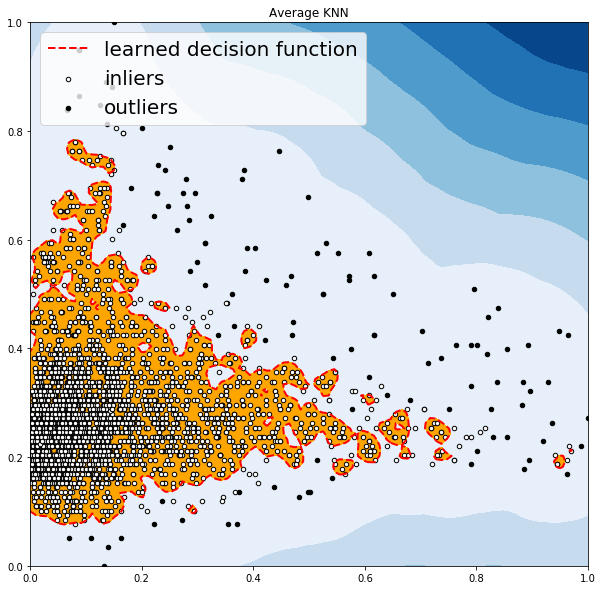

In [9]:
files = os.listdir(root)

# 采用与上述异常数据处理相似的方法
for file in files[:3]:
    print('\n\ndataset wine:', file)
    file = root + file

    dataset = pd.read_csv(file) 
    former = attribute[0]
    latter = attribute[1]
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset[[former, latter]] = scaler.fit_transform(dataset[[former, latter]])
    dataset[[former, latter]].head()

    X1 = dataset[former].values.reshape(-1, 1)
    X2 = dataset[latter].values.reshape(-1, 1)
    X = np.concatenate((X1, X2), axis=1)

    xx, yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
    for i, (clf_name, clf) in enumerate(classifiers.items()):
        clf.fit(X)

        scores_pred = clf.decision_function(X) * -1

        y_pred = clf.predict(X)
        n_inliers = len(y_pred) - np.count_nonzero(y_pred)
        n_outliers = np.count_nonzero(y_pred == 1)
        plt.figure(figsize=(10, 10))

        dfx = dataset
        dfx['outlier'] = y_pred.tolist()

        IX1 = np.array(dfx[former][dfx['outlier'] == 0]).reshape(-1, 1)
        IX2 = np.array(dfx[latter][dfx['outlier'] == 0]).reshape(-1, 1)

        # OX1 - outlier feature 1, OX2 - outlier feature 2
        OX1 = dfx[former][dfx['outlier'] == 1].values.reshape(-1, 1)
        OX2 = dfx[latter][dfx['outlier'] == 1].values.reshape(-1, 1)

        print('OUTLIERS : ', n_outliers, 'INLIERS : ', n_inliers, clf_name)

        threshold = stats.scoreatpercentile(scores_pred, 100 * outliers_fraction)

        Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
        Z = Z.reshape(xx.shape)

        plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7), cmap=plt.cm.Blues_r)

        a = plt.contour(xx, yy, Z, levels=[threshold], linewidths=2, colors='red')

        plt.contourf(xx, yy, Z, levels=[threshold, Z.max()], colors='orange')

        b = plt.scatter(IX1, IX2, c='white', s=20, edgecolor='k')

        c = plt.scatter(OX1, OX2, c='black', s=20, edgecolor='k')

        plt.axis('tight')

        plt.legend(
            [a.collections[0], b, c],
            ['learned decision function', 'inliers', 'outliers'],
            prop=matplotlib.font_manager.FontProperties(size=20),
            loc=2)

        plt.xlim((0, 1))
        plt.ylim((0, 1))
        plt.title(clf_name)
        plt.show()


#### 结果分析

> Local Correlation Integral (LOCI)方法

LOCI对于检测异常值和异常值组非常有效，它为每个点提供LOCI图，总结了该点周围区域内数据的大量信息，确定了簇，微簇，它们的直径以及它们的簇间距离；现有的异常检测方法都不能匹配此功能，因为它们只为每个点输出一个数字；

> Feature Bagging方法

功能装袋检测器在数据集的各种子样本上安装了许多基本检测器，它使用平均或其他组合方法来提高预测精度，默认情况下，Local Outlier Factor（LOF）用作基本估算器。 但是，任何估计器都可以用作基本估计器，例如kNN和ABOD；特征装袋首先通过随机选择特征子集来构造n个子样本。 这带来了基本估计的多样性。 最后，通过平均或取所有基本检测器的最大值来生成预测分数；

> ABOD方法

它考虑每个点与其邻居之间的关系，它没有考虑这些邻居之间的关系，其加权余弦分数与所有邻居的方差可视为偏离分数；ABOD在多维数据上表现良好；

> k-Nearest Neighbors Detector方法

对于任何数据点，到第k个最近邻居的距离可以被视为远离分数；PyOD支持三个kNN探测器：
最大：使用第k个邻居的距离作为离群值；
均值：使用所有k个邻居的平均值作为离群值得分；
中位数：使用与邻居的距离的中位数作为离群值得分；

> Isolation Forest方法

它在内部使用scikit-learn库，在此方法中，使用一组树完成数据分区； 隔离森林提供了一个异常分数，用于查看结构中点的隔离程度， 然后使用异常分数来识别来自正常观察的异常值，隔离森林在多维数据上表现良好；

> Histogram-based Outlier Detection方法

这是一种有效的无监督方法，它假设特征独立并通过构建直方图来计算异常值，它比多变量方法快得多，但代价是精度较低；

### 3.2 diff.score, volatile.acidity



dataset wine: wine_benchmark_0941.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


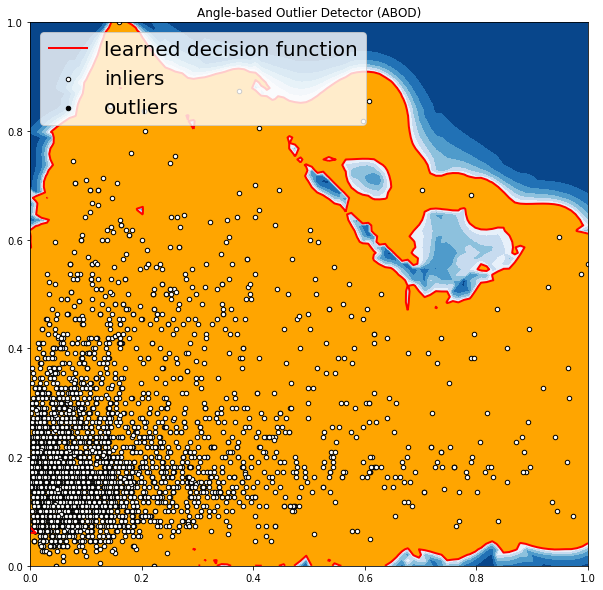

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


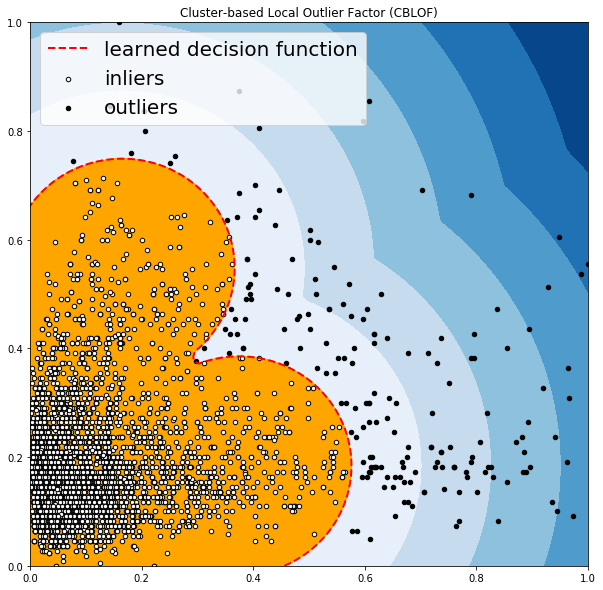

OUTLIERS :  182 INLIERS :  3557 Feature Bagging


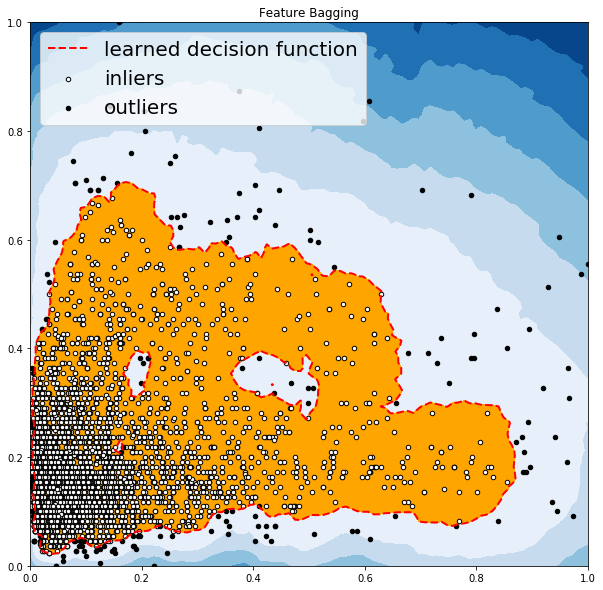

OUTLIERS :  181 INLIERS :  3558 Histogram-base Outlier Detection (HBOS)


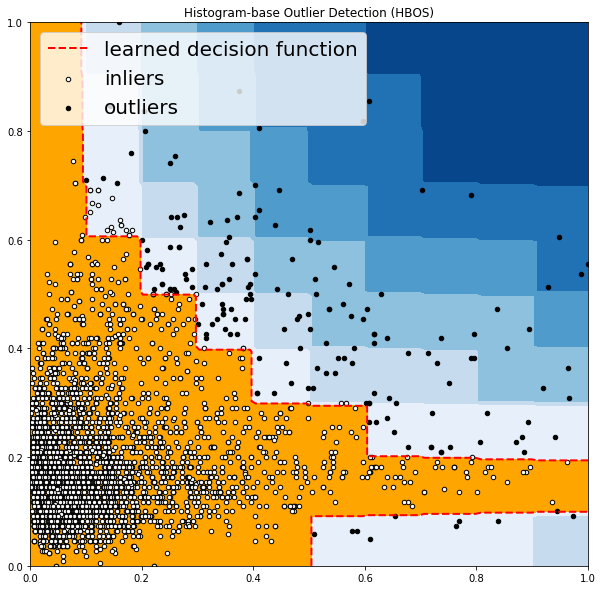

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


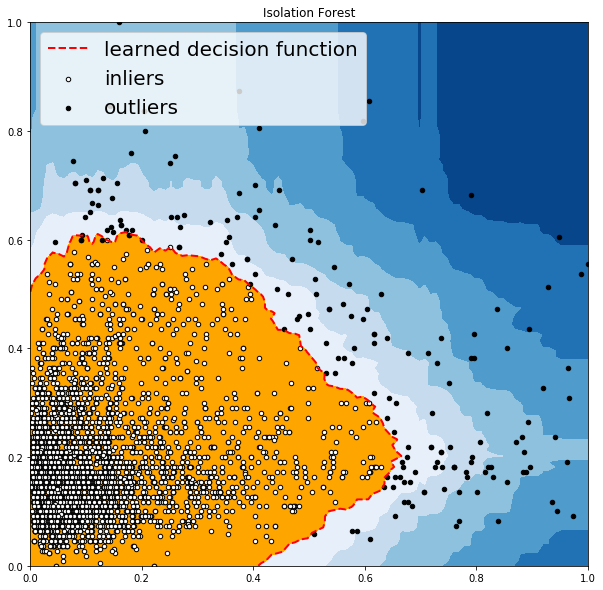

OUTLIERS :  138 INLIERS :  3601 K Nearest Neighbors (KNN)


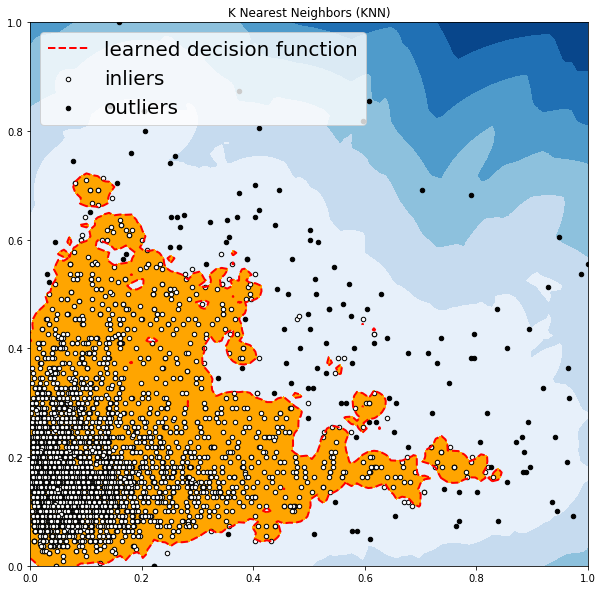

OUTLIERS :  98 INLIERS :  3641 Average KNN


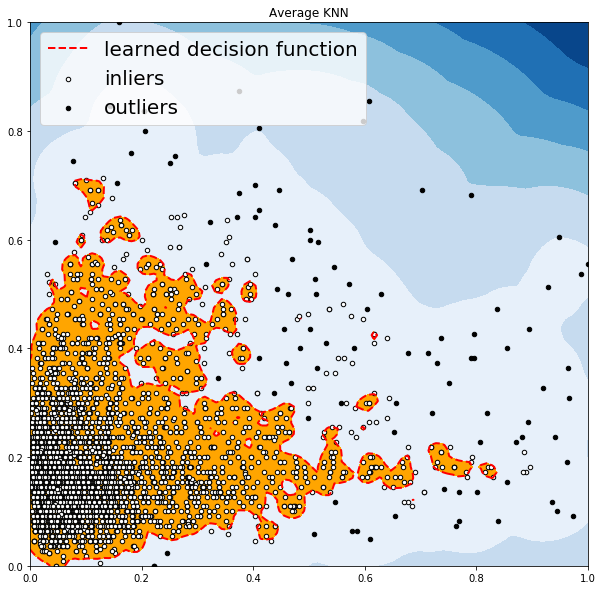



dataset wine: wine_benchmark_0955.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


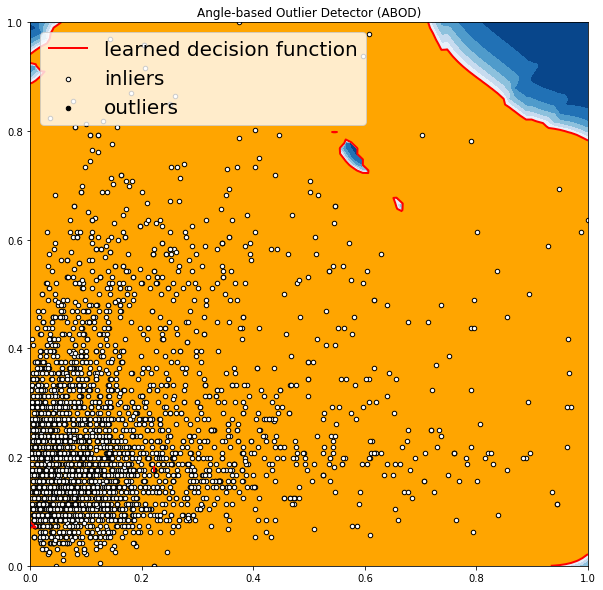

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


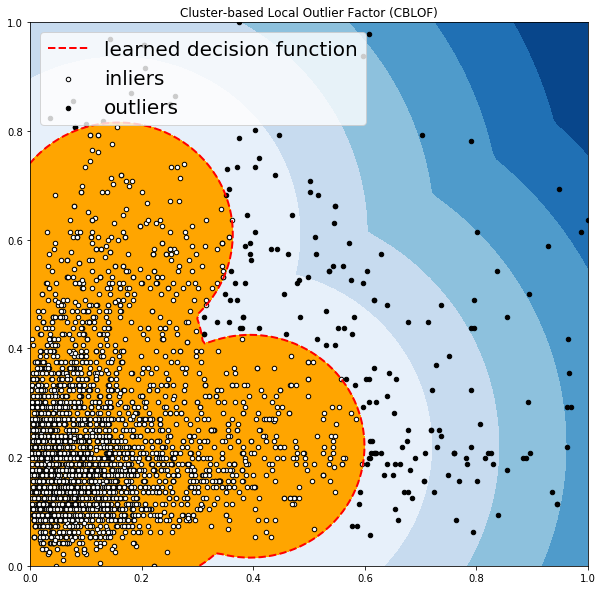

OUTLIERS :  175 INLIERS :  3564 Feature Bagging


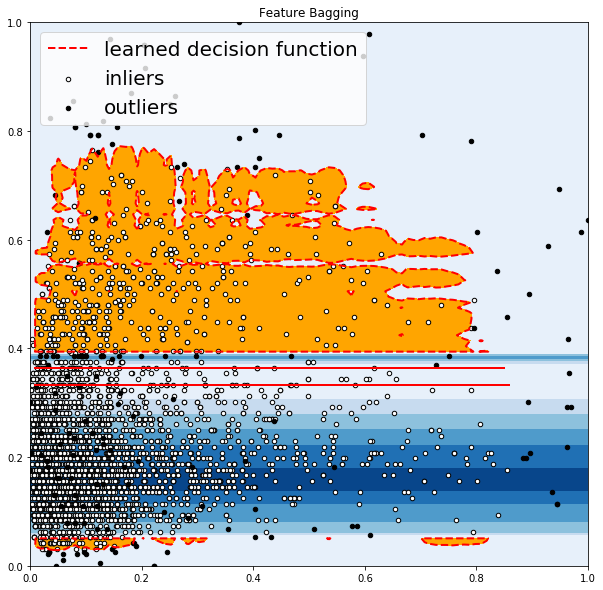

OUTLIERS :  185 INLIERS :  3554 Histogram-base Outlier Detection (HBOS)


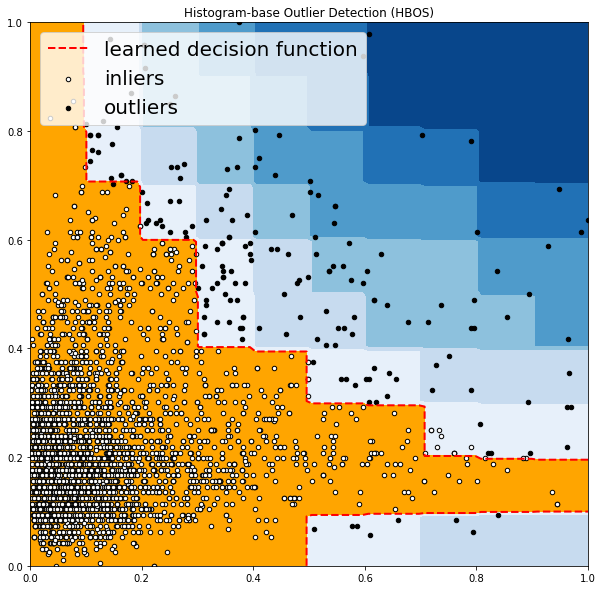

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


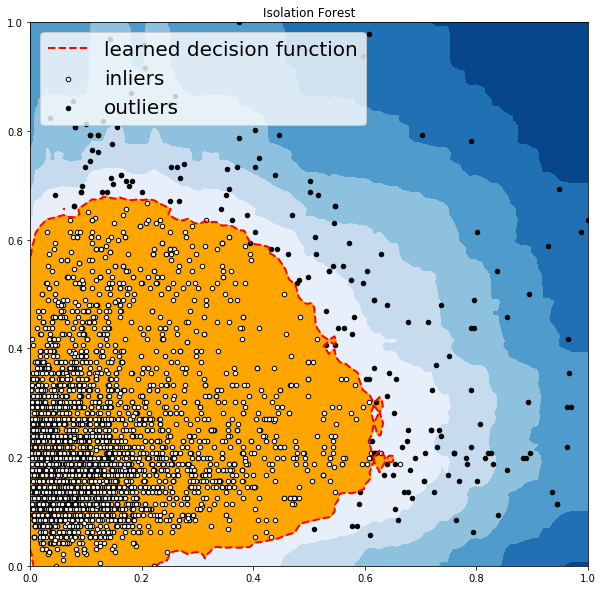

OUTLIERS :  146 INLIERS :  3593 K Nearest Neighbors (KNN)


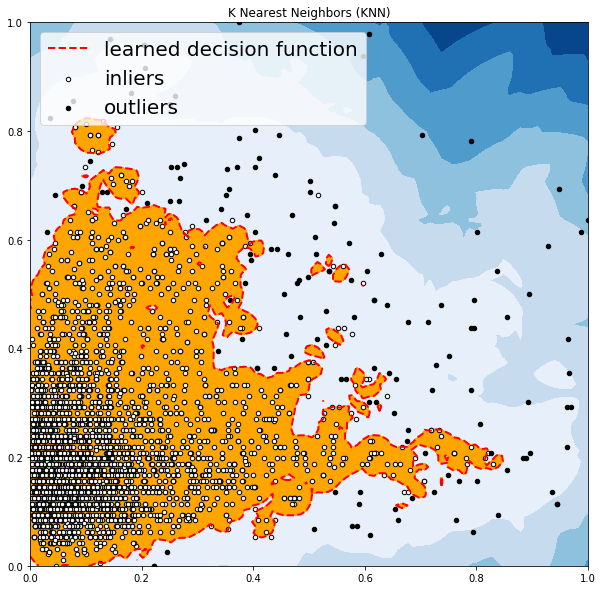

OUTLIERS :  103 INLIERS :  3636 Average KNN


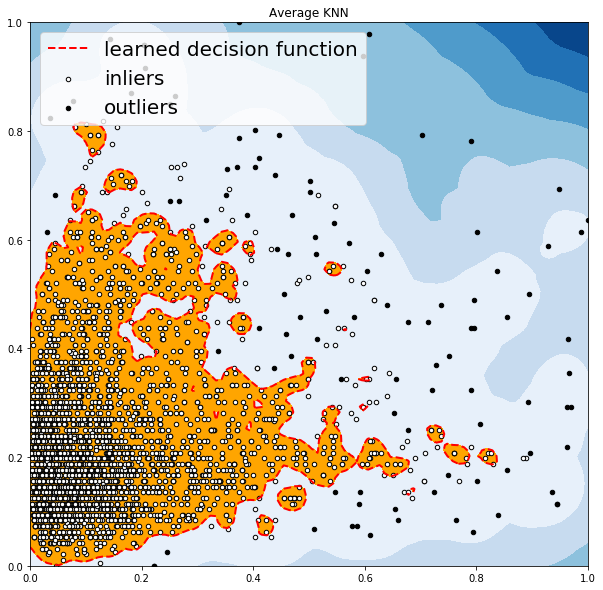

In [10]:
files = os.listdir(root)

for file in files[:2]:
    print('\n\ndataset wine:', file)
    file = root + file

    dataset = pd.read_csv(file)  
    former = attribute[0]
    latter = attribute[2]
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset[[former, latter]] = scaler.fit_transform(dataset[[former, latter]])
    dataset[[former, latter]].head()

    X1 = dataset[former].values.reshape(-1, 1)
    X2 = dataset[latter].values.reshape(-1, 1)
    X = np.concatenate((X1, X2), axis=1)

    xx, yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
    for i, (clf_name, clf) in enumerate(classifiers.items()):
        clf.fit(X)

        scores_pred = clf.decision_function(X) * -1

        y_pred = clf.predict(X)
        n_inliers = len(y_pred) - np.count_nonzero(y_pred)
        n_outliers = np.count_nonzero(y_pred == 1)
        plt.figure(figsize=(10, 10))

        dfx = dataset
        dfx['outlier'] = y_pred.tolist()

        IX1 = np.array(dfx[former][dfx['outlier'] == 0]).reshape(-1, 1)
        IX2 = np.array(dfx[latter][dfx['outlier'] == 0]).reshape(-1, 1)

        OX1 = dfx[former][dfx['outlier'] == 1].values.reshape(-1, 1)
        OX2 = dfx[latter][dfx['outlier'] == 1].values.reshape(-1, 1)

        print('OUTLIERS : ', n_outliers, 'INLIERS : ', n_inliers, clf_name)

        threshold = stats.scoreatpercentile(scores_pred, 100 * outliers_fraction)

        Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
        Z = Z.reshape(xx.shape)

        plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7), cmap=plt.cm.Blues_r)

        a = plt.contour(xx, yy, Z, levels=[threshold], linewidths=2, colors='red')

        plt.contourf(xx, yy, Z, levels=[threshold, Z.max()], colors='orange')

        b = plt.scatter(IX1, IX2, c='white', s=20, edgecolor='k')

        c = plt.scatter(OX1, OX2, c='black', s=20, edgecolor='k')

        plt.axis('tight')

        plt.legend(
            [a.collections[0], b, c],
            ['learned decision function', 'inliers', 'outliers'],
            prop=matplotlib.font_manager.FontProperties(size=20),
            loc=2)

        plt.xlim((0, 1))
        plt.ylim((0, 1))
        plt.title(clf_name)
        plt.show()



#### 结果分析

> ABOD方法

它考虑每个点与其邻居之间的关系，它没有考虑这些邻居之间的关系，其加权余弦分数与所有邻居的方差可视为偏离分数；ABOD在多维数据上表现良好；

> k-Nearest Neighbors Detector方法

对于任何数据点，到第k个最近邻居的距离可以被视为远离分数；PyOD支持三个kNN探测器：
最大：使用第k个邻居的距离作为离群值；
均值：使用所有k个邻居的平均值作为离群值得分；
中位数：使用与邻居的距离的中位数作为离群值得分；

> Isolation Forest方法

它在内部使用scikit-learn库，在此方法中，使用一组树完成数据分区； 隔离森林提供了一个异常分数，用于查看结构中点的隔离程度， 然后使用异常分数来识别来自正常观察的异常值，隔离森林在多维数据上表现良好；

> Histogram-based Outlier Detection方法

这是一种有效的无监督方法，它假设特征独立并通过构建直方图来计算异常值，它比多变量方法快得多，但代价是精度较低；

> Local Correlation Integral (LOCI)方法

LOCI对于检测异常值和异常值组非常有效，它为每个点提供LOCI图，总结了该点周围区域内数据的大量信息，确定了簇，微簇，它们的直径以及它们的簇间距离；现有的异常检测方法都不能匹配此功能，因为它们只为每个点输出一个数字；

> Feature Bagging方法

功能装袋检测器在数据集的各种子样本上安装了许多基本检测器，它使用平均或其他组合方法来提高预测精度，默认情况下，Local Outlier Factor（LOF）用作基本估算器。 但是，任何估计器都可以用作基本估计器，例如kNN和ABOD；特征装袋首先通过随机选择特征子集来构造n个子样本。 这带来了基本估计的多样性。 最后，通过平均或取所有基本检测器的最大值来生成预测分数；

### 3.3 diff.score, citric.acid



dataset wine: wine_benchmark_0982.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


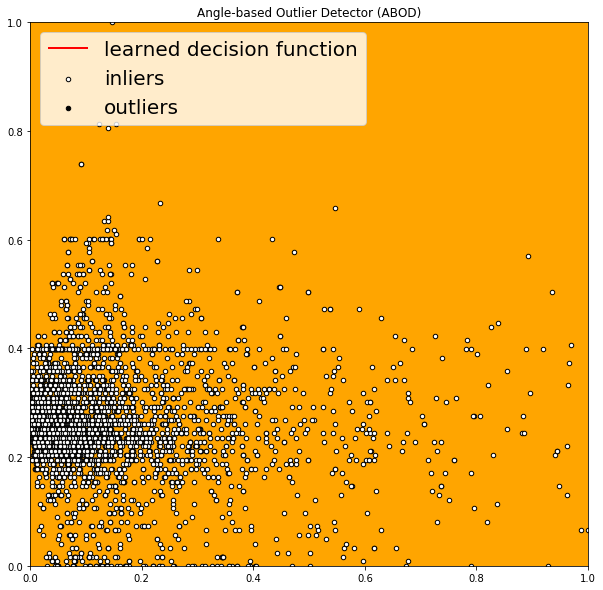

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


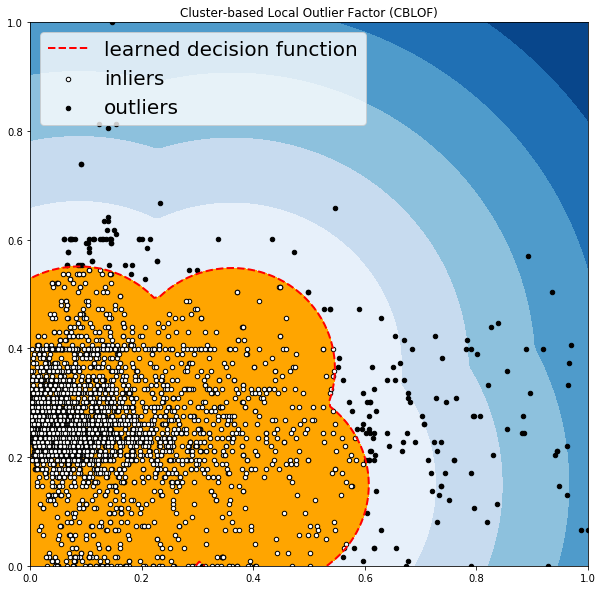

OUTLIERS :  178 INLIERS :  3561 Feature Bagging


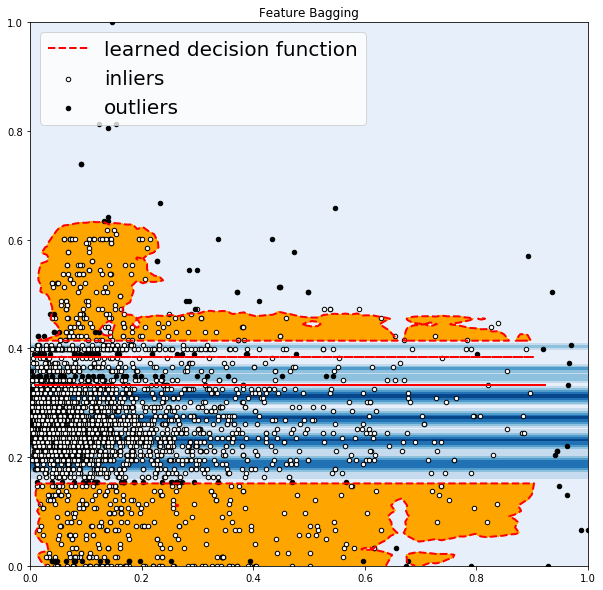

OUTLIERS :  172 INLIERS :  3567 Histogram-base Outlier Detection (HBOS)


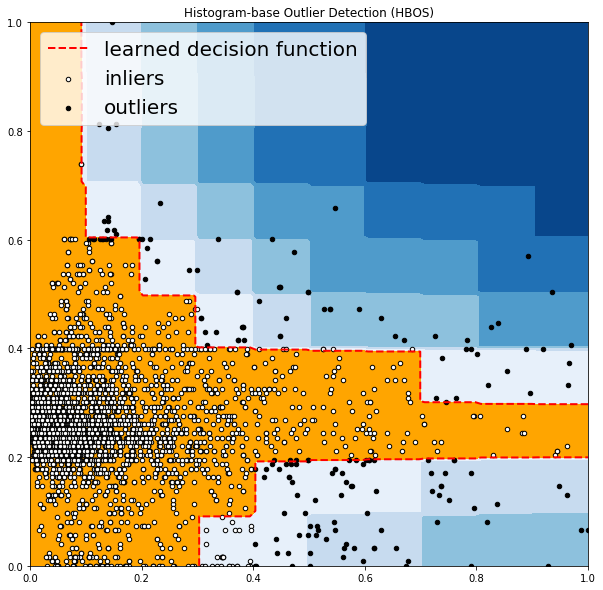

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


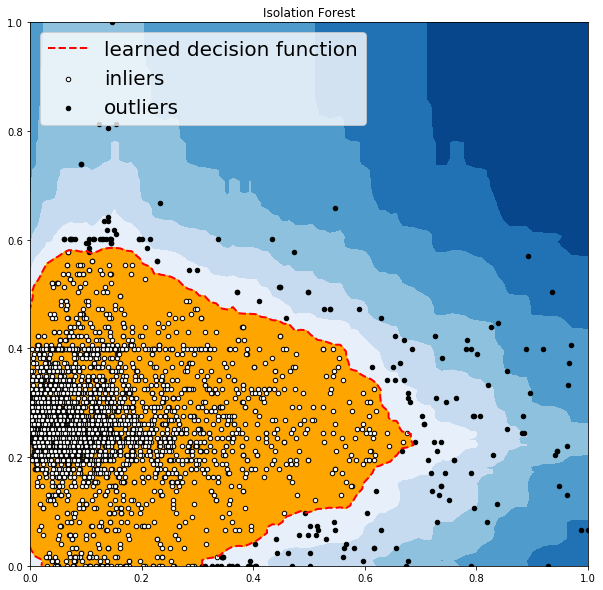

OUTLIERS :  145 INLIERS :  3594 K Nearest Neighbors (KNN)


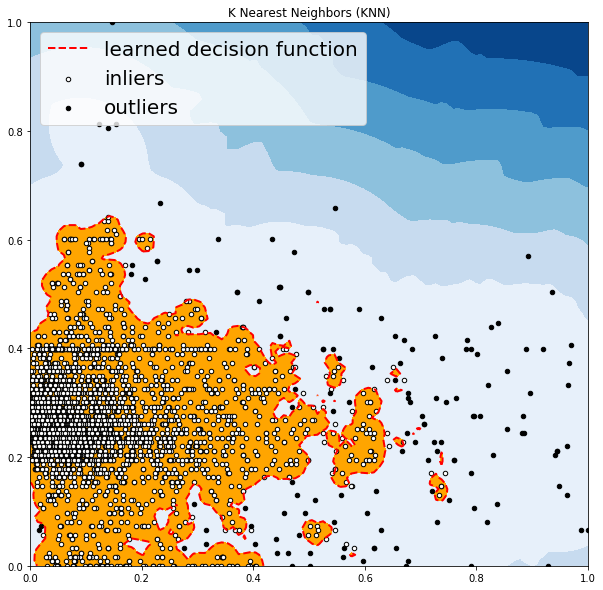

OUTLIERS :  95 INLIERS :  3644 Average KNN


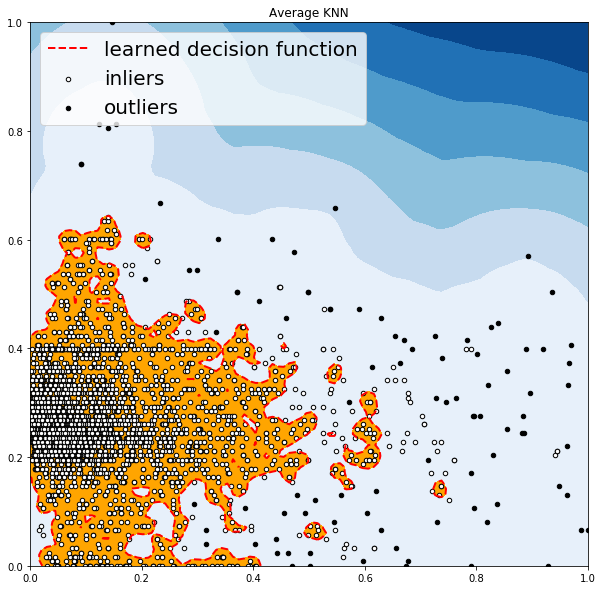



dataset wine: wine_benchmark_1322.csv
OUTLIERS :  0 INLIERS :  3504 Angle-based Outlier Detector (ABOD)


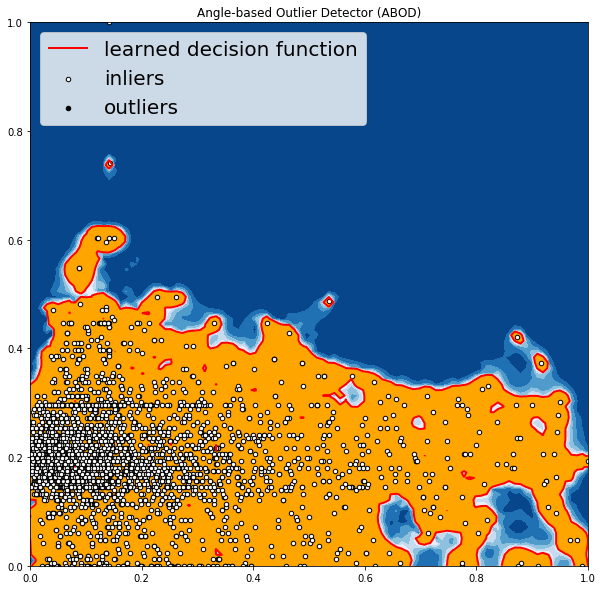

OUTLIERS :  176 INLIERS :  3328 Cluster-based Local Outlier Factor (CBLOF)


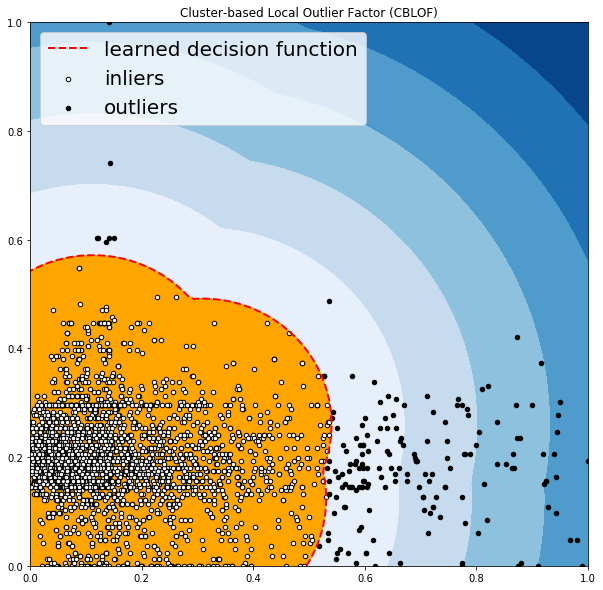

OUTLIERS :  153 INLIERS :  3351 Feature Bagging


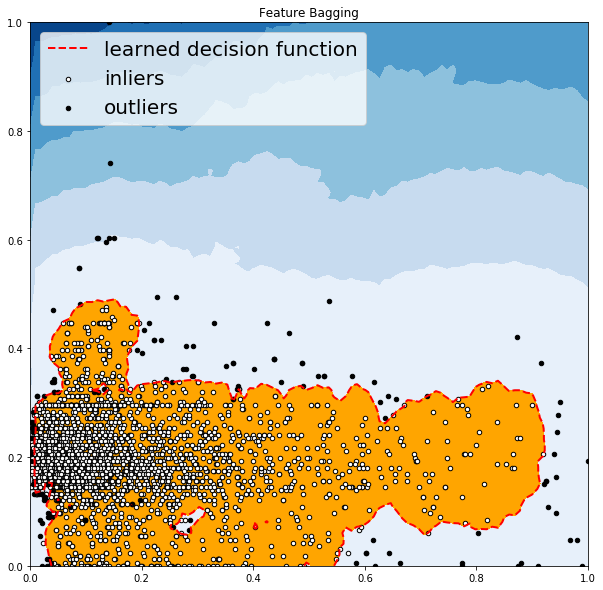

OUTLIERS :  167 INLIERS :  3337 Histogram-base Outlier Detection (HBOS)


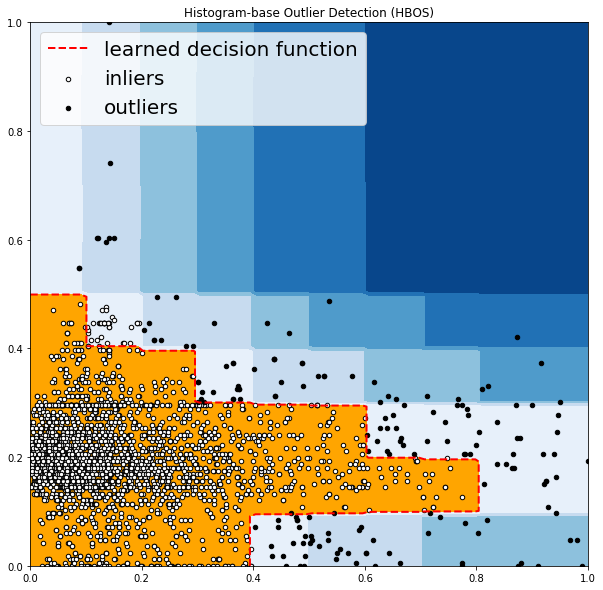

OUTLIERS :  176 INLIERS :  3328 Isolation Forest


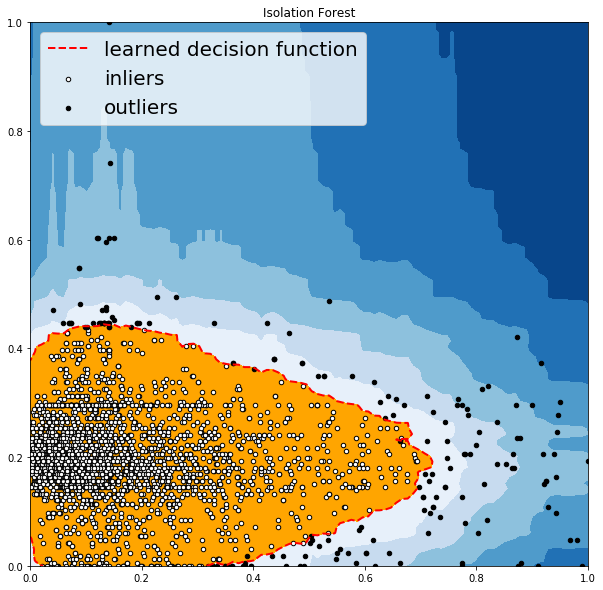

OUTLIERS :  137 INLIERS :  3367 K Nearest Neighbors (KNN)


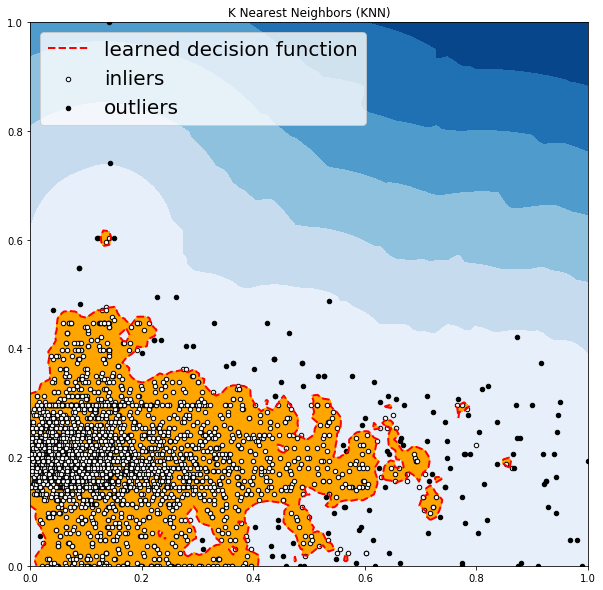

OUTLIERS :  86 INLIERS :  3418 Average KNN


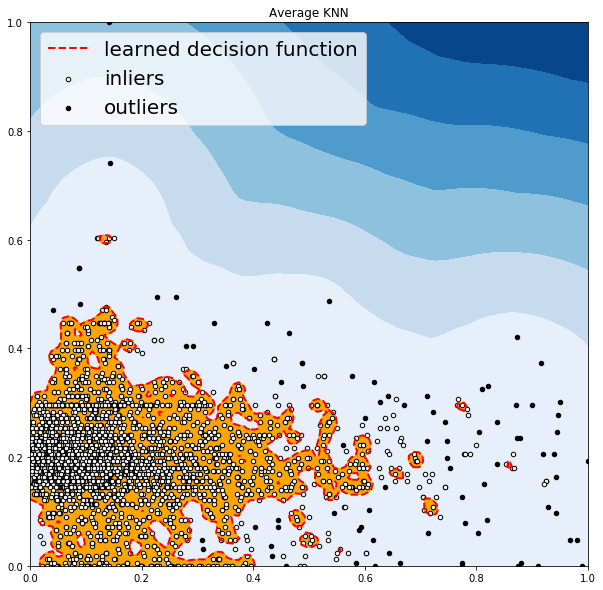

In [12]:
files = os.listdir(root)
for file in files[:2]:
    print('\n\ndataset wine:', file)
    file = root + file

    dataset = pd.read_csv(file)  
    former = attribute[0]
    latter = attribute[3]
    
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset[[former, latter]] = scaler.fit_transform(dataset[[former, latter]])
    dataset[[former, latter]].head()

    X1 = dataset[former].values.reshape(-1, 1)
    X2 = dataset[latter].values.reshape(-1, 1)
    X = np.concatenate((X1, X2), axis=1)

    xx, yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
    for i, (clf_name, clf) in enumerate(classifiers.items()):
        clf.fit(X)
        scores_pred = clf.decision_function(X) * -1

        y_pred = clf.predict(X)
        n_inliers = len(y_pred) - np.count_nonzero(y_pred)
        n_outliers = np.count_nonzero(y_pred == 1)
        plt.figure(figsize=(10, 10))

        dfx = dataset
        dfx['outlier'] = y_pred.tolist()

        IX1 = np.array(dfx[former][dfx['outlier'] == 0]).reshape(-1, 1)
        IX2 = np.array(dfx[latter][dfx['outlier'] == 0]).reshape(-1, 1)

        OX1 = dfx[former][dfx['outlier'] == 1].values.reshape(-1, 1)
        OX2 = dfx[latter][dfx['outlier'] == 1].values.reshape(-1, 1)

        print('OUTLIERS : ', n_outliers, 'INLIERS : ', n_inliers, clf_name)

        threshold = stats.scoreatpercentile(scores_pred, 100 * outliers_fraction)

        Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
        Z = Z.reshape(xx.shape)
        plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7), cmap=plt.cm.Blues_r)
        a = plt.contour(xx, yy, Z, levels=[threshold], linewidths=2, colors='red')
        plt.contourf(xx, yy, Z, levels=[threshold, Z.max()], colors='orange')

        b = plt.scatter(IX1, IX2, c='white', s=20, edgecolor='k')

        c = plt.scatter(OX1, OX2, c='black', s=20, edgecolor='k')

        plt.axis('tight')

        plt.legend(
            [a.collections[0], b, c],
            ['learned decision function', 'inliers', 'outliers'],
            prop=matplotlib.font_manager.FontProperties(size=20),
            loc=2)

        plt.xlim((0, 1))
        plt.ylim((0, 1))
        plt.title(clf_name)
        plt.show()

#### 结果分析

> ABOD方法

它考虑每个点与其邻居之间的关系，它没有考虑这些邻居之间的关系，其加权余弦分数与所有邻居的方差可视为偏离分数；ABOD在多维数据上表现良好；

> k-Nearest Neighbors Detector方法

对于任何数据点，到第k个最近邻居的距离可以被视为远离分数；PyOD支持三个kNN探测器：
最大：使用第k个邻居的距离作为离群值；
均值：使用所有k个邻居的平均值作为离群值得分；
中位数：使用与邻居的距离的中位数作为离群值得分；

> Isolation Forest方法

它在内部使用scikit-learn库，在此方法中，使用一组树完成数据分区； 隔离森林提供了一个异常分数，用于查看结构中点的隔离程度， 然后使用异常分数来识别来自正常观察的异常值，隔离森林在多维数据上表现良好；

> Histogram-based Outlier Detection方法

这是一种有效的无监督方法，它假设特征独立并通过构建直方图来计算异常值，它比多变量方法快得多，但代价是精度较低；

> Local Correlation Integral (LOCI)方法

LOCI对于检测异常值和异常值组非常有效，它为每个点提供LOCI图，总结了该点周围区域内数据的大量信息，确定了簇，微簇，它们的直径以及它们的簇间距离；现有的异常检测方法都不能匹配此功能，因为它们只为每个点输出一个数字；

> Feature Bagging方法

功能装袋检测器在数据集的各种子样本上安装了许多基本检测器，它使用平均或其他组合方法来提高预测精度，默认情况下，Local Outlier Factor（LOF）用作基本估算器。 但是，任何估计器都可以用作基本估计器，例如kNN和ABOD；特征装袋首先通过随机选择特征子集来构造n个子样本。 这带来了基本估计的多样性。 最后，通过平均或取所有基本检测器的最大值来生成预测分数；

### 3.4 diff.score, residual.sugar



dataset wine: wine_benchmark_0941.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


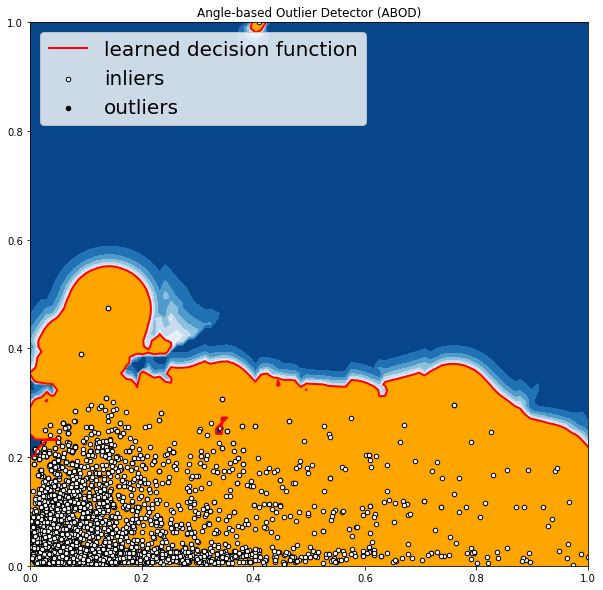

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


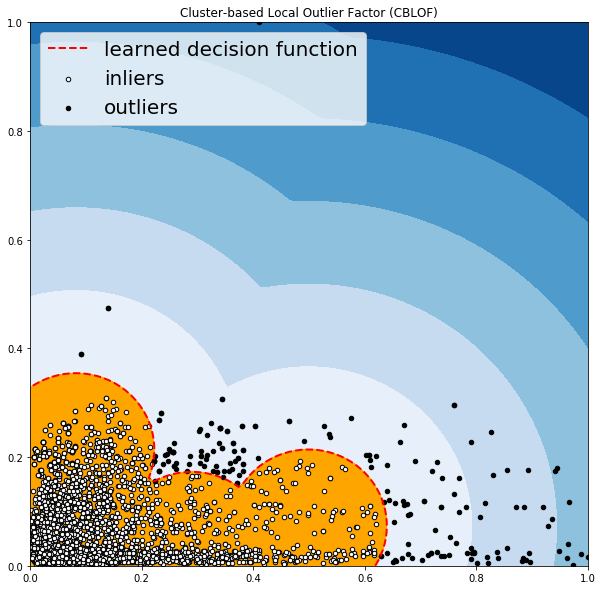

OUTLIERS :  158 INLIERS :  3581 Feature Bagging


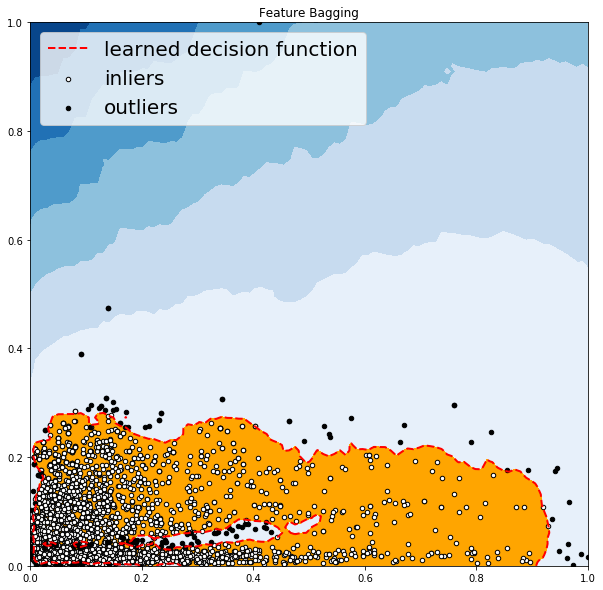

OUTLIERS :  186 INLIERS :  3553 Histogram-base Outlier Detection (HBOS)


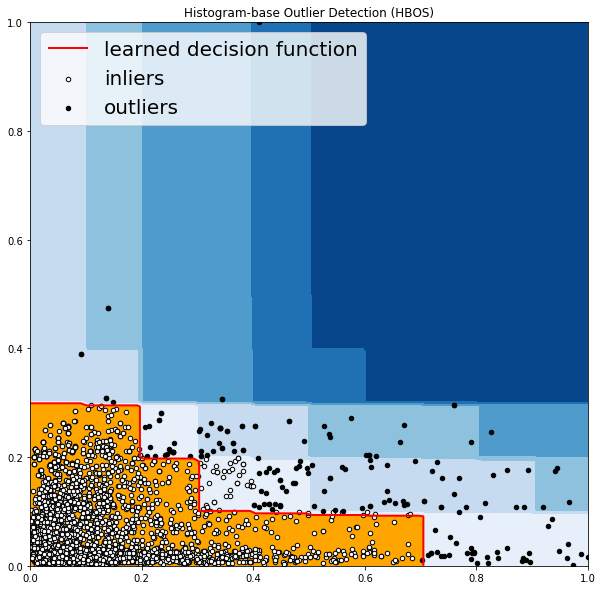

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


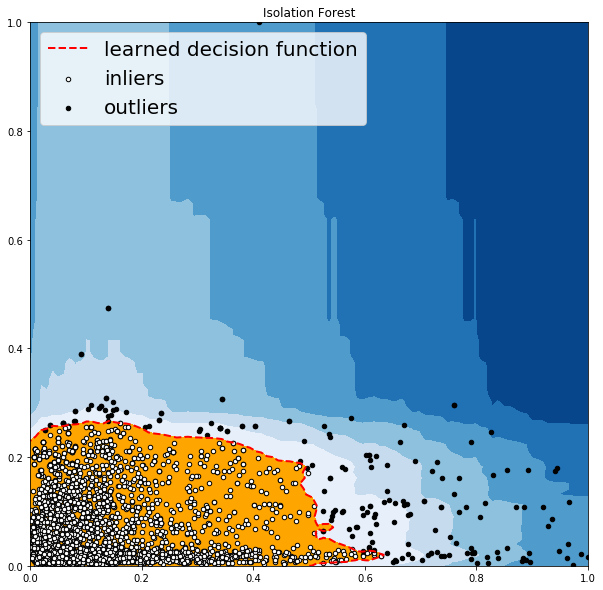

OUTLIERS :  140 INLIERS :  3599 K Nearest Neighbors (KNN)


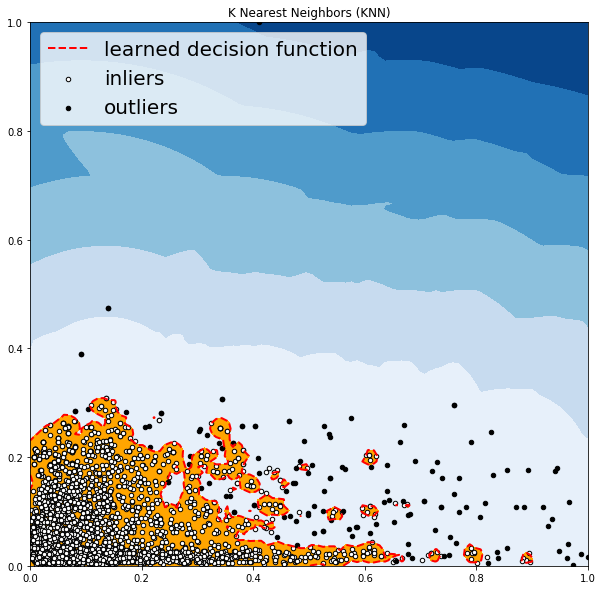

OUTLIERS :  93 INLIERS :  3646 Average KNN


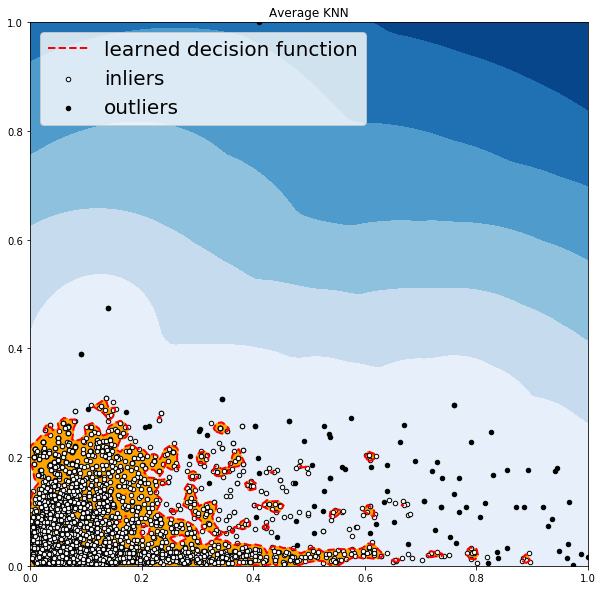



dataset wine: wine_benchmark_0955.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


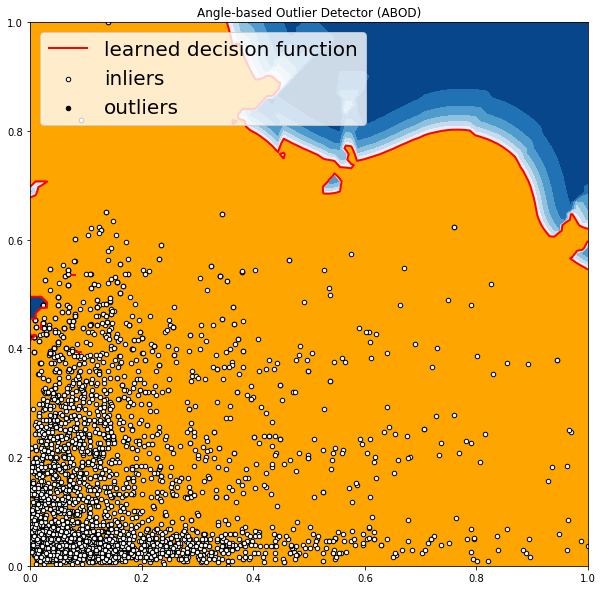

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


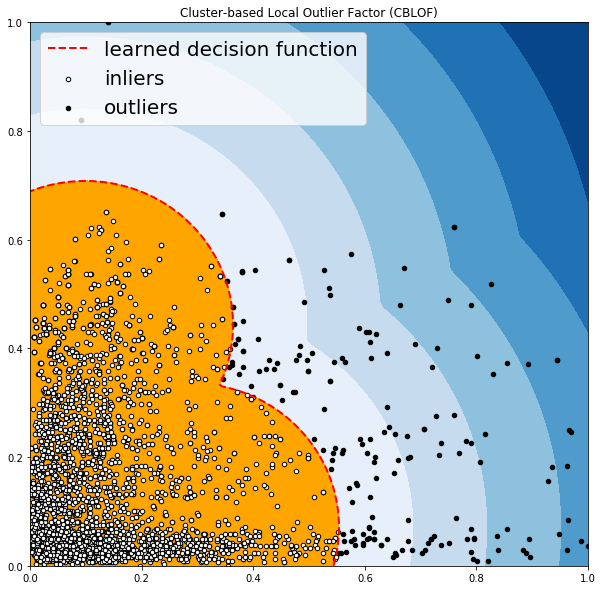

OUTLIERS :  175 INLIERS :  3564 Feature Bagging


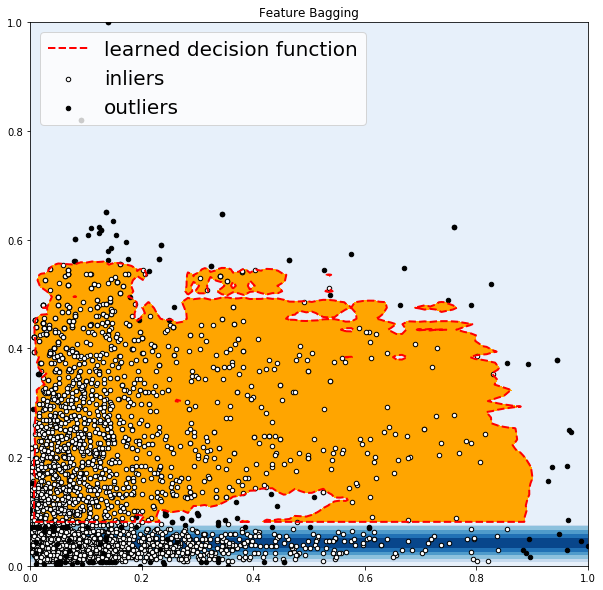

OUTLIERS :  170 INLIERS :  3569 Histogram-base Outlier Detection (HBOS)


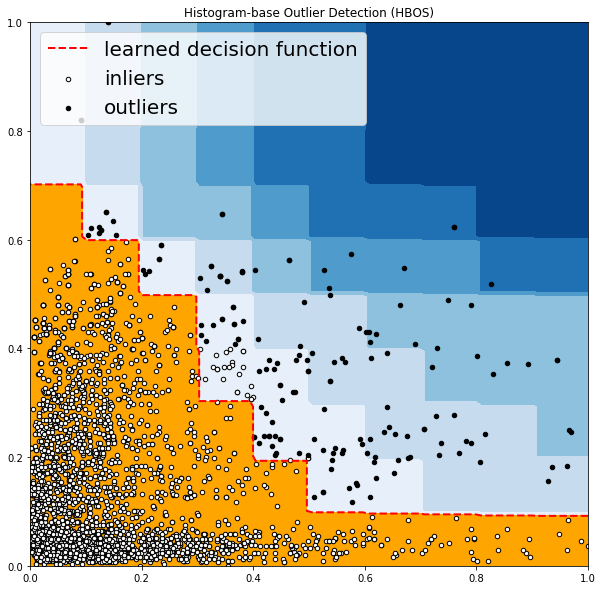

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


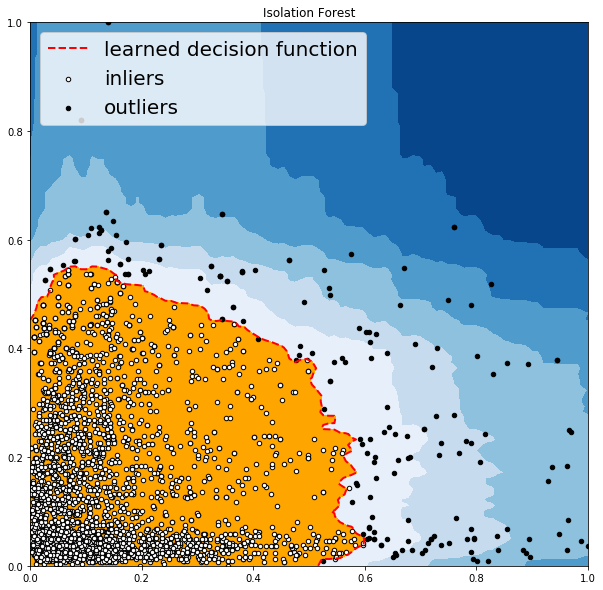

OUTLIERS :  149 INLIERS :  3590 K Nearest Neighbors (KNN)


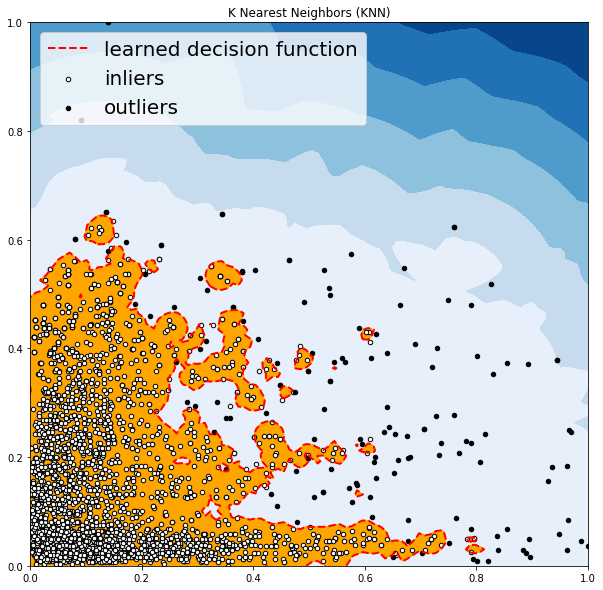

OUTLIERS :  92 INLIERS :  3647 Average KNN


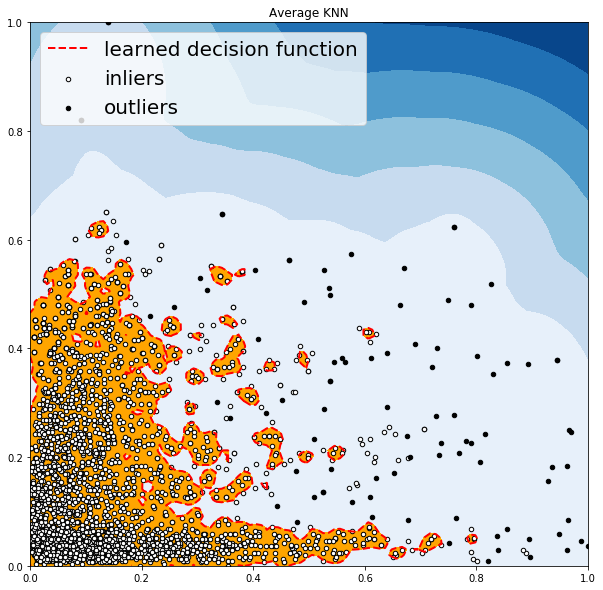

In [13]:
files = os.listdir(root)

for file in files[:2]:
    print('\n\ndataset wine:', file)
    file = root + file

    dataset = pd.read_csv(file)  
    former = attribute[0]
    latter = attribute[4]
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset[[former, latter]] = scaler.fit_transform(dataset[[former, latter]])
    dataset[[former, latter]].head()

    X1 = dataset[former].values.reshape(-1, 1)
    X2 = dataset[latter].values.reshape(-1, 1)
    X = np.concatenate((X1, X2), axis=1)

    xx, yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
    for i, (clf_name, clf) in enumerate(classifiers.items()):
        clf.fit(X)
        scores_pred = clf.decision_function(X) * -1

        y_pred = clf.predict(X)
        n_inliers = len(y_pred) - np.count_nonzero(y_pred)
        n_outliers = np.count_nonzero(y_pred == 1)
        plt.figure(figsize=(10, 10))

        dfx = dataset
        dfx['outlier'] = y_pred.tolist()

        IX1 = np.array(dfx[former][dfx['outlier'] == 0]).reshape(-1, 1)
        IX2 = np.array(dfx[latter][dfx['outlier'] == 0]).reshape(-1, 1)

        OX1 = dfx[former][dfx['outlier'] == 1].values.reshape(-1, 1)
        OX2 = dfx[latter][dfx['outlier'] == 1].values.reshape(-1, 1)

        print('OUTLIERS : ', n_outliers, 'INLIERS : ', n_inliers, clf_name)
        threshold = stats.scoreatpercentile(scores_pred, 100 * outliers_fraction)

        Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
        Z = Z.reshape(xx.shape)
        plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7), cmap=plt.cm.Blues_r)
        a = plt.contour(xx, yy, Z, levels=[threshold], linewidths=2, colors='red')
        plt.contourf(xx, yy, Z, levels=[threshold, Z.max()], colors='orange')
        b = plt.scatter(IX1, IX2, c='white', s=20, edgecolor='k')
        c = plt.scatter(OX1, OX2, c='black', s=20, edgecolor='k')
        plt.axis('tight')

        plt.legend(
            [a.collections[0], b, c],
            ['learned decision function', 'inliers', 'outliers'],
            prop=matplotlib.font_manager.FontProperties(size=20),
            loc=2)

        plt.xlim((0, 1))
        plt.ylim((0, 1))
        plt.title(clf_name)
        plt.show()

#### 结果分析

> ABOD方法

它考虑每个点与其邻居之间的关系，它没有考虑这些邻居之间的关系，其加权余弦分数与所有邻居的方差可视为偏离分数；ABOD在多维数据上表现良好；

> k-Nearest Neighbors Detector方法

对于任何数据点，到第k个最近邻居的距离可以被视为远离分数；PyOD支持三个kNN探测器：
最大：使用第k个邻居的距离作为离群值；
均值：使用所有k个邻居的平均值作为离群值得分；
中位数：使用与邻居的距离的中位数作为离群值得分；

> Isolation Forest方法

它在内部使用scikit-learn库，在此方法中，使用一组树完成数据分区； 隔离森林提供了一个异常分数，用于查看结构中点的隔离程度， 然后使用异常分数来识别来自正常观察的异常值，隔离森林在多维数据上表现良好；

> Histogram-based Outlier Detection方法

这是一种有效的无监督方法，它假设特征独立并通过构建直方图来计算异常值，它比多变量方法快得多，但代价是精度较低；

> Local Correlation Integral (LOCI)方法

LOCI对于检测异常值和异常值组非常有效，它为每个点提供LOCI图，总结了该点周围区域内数据的大量信息，确定了簇，微簇，它们的直径以及它们的簇间距离；现有的异常检测方法都不能匹配此功能，因为它们只为每个点输出一个数字；

> Feature Bagging方法

功能装袋检测器在数据集的各种子样本上安装了许多基本检测器，它使用平均或其他组合方法来提高预测精度，默认情况下，Local Outlier Factor（LOF）用作基本估算器。 但是，任何估计器都可以用作基本估计器，例如kNN和ABOD；特征装袋首先通过随机选择特征子集来构造n个子样本。 这带来了基本估计的多样性。 最后，通过平均或取所有基本检测器的最大值来生成预测分数；

> Clustering Based Local Outlier Factor方法

它将数据分为小型集群和大型集群，然后根据点所属的簇的大小以及到最近的大簇的距离来计算异常分数

### 3.5 diff.score, chlorides



dataset wine: wine_benchmark_0941.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


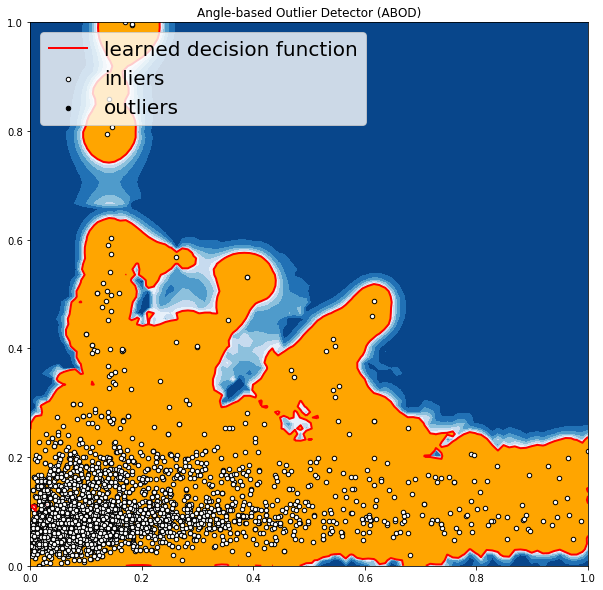

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


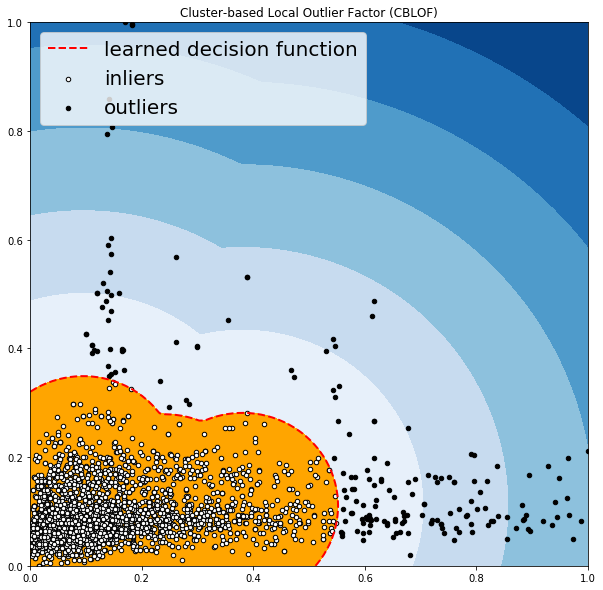

OUTLIERS :  179 INLIERS :  3560 Feature Bagging


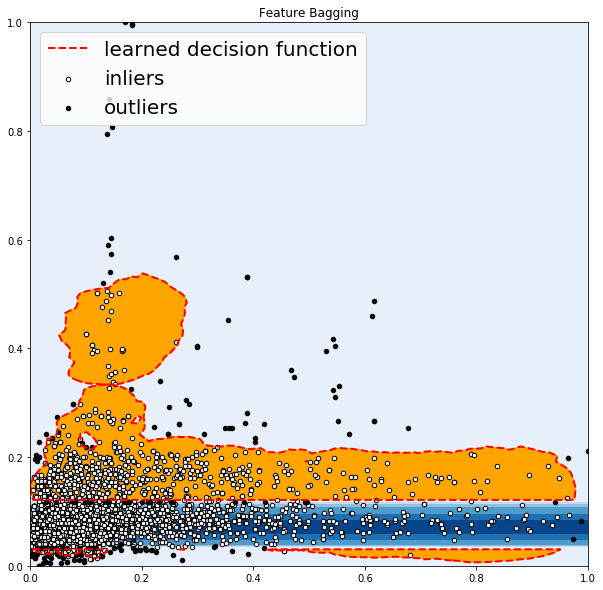

OUTLIERS :  175 INLIERS :  3564 Histogram-base Outlier Detection (HBOS)


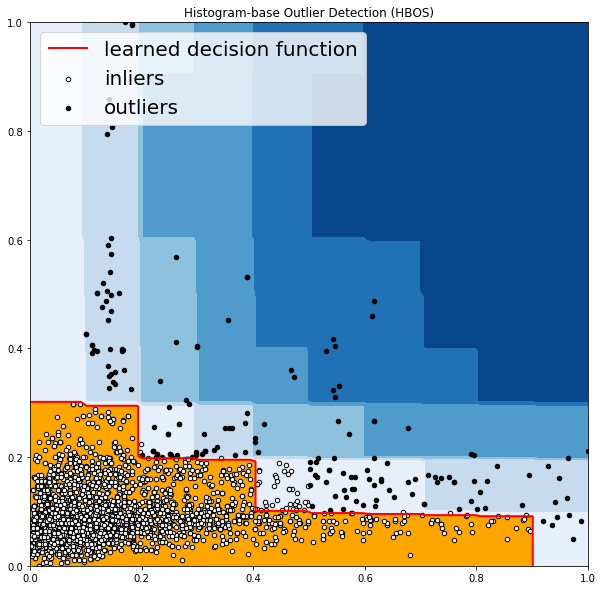

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


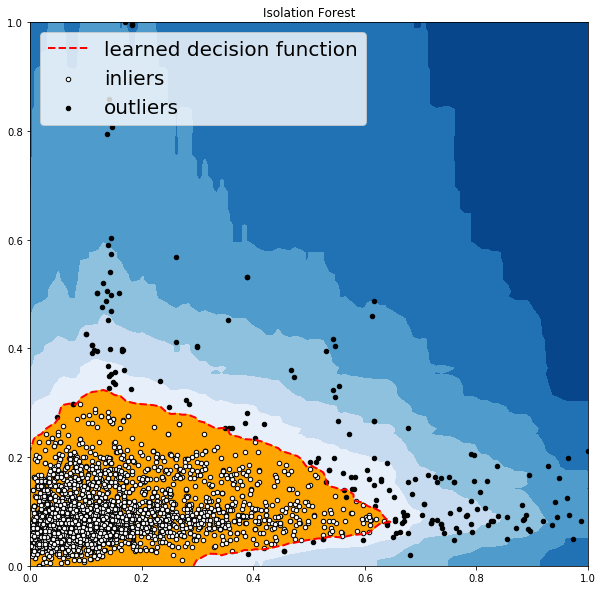

OUTLIERS :  152 INLIERS :  3587 K Nearest Neighbors (KNN)


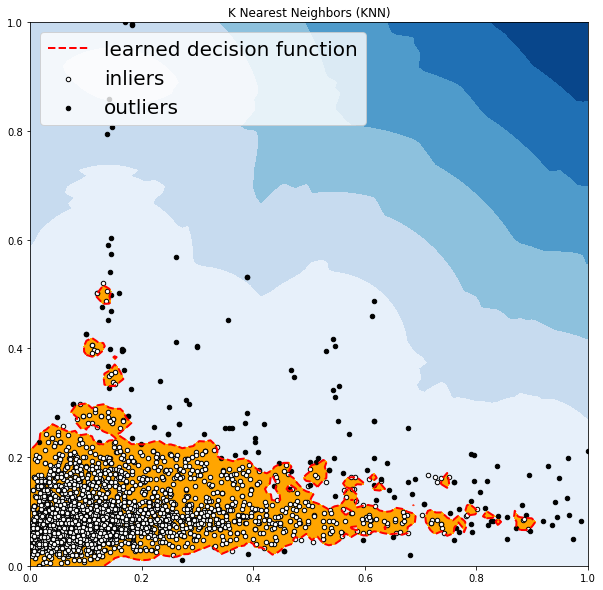

OUTLIERS :  101 INLIERS :  3638 Average KNN


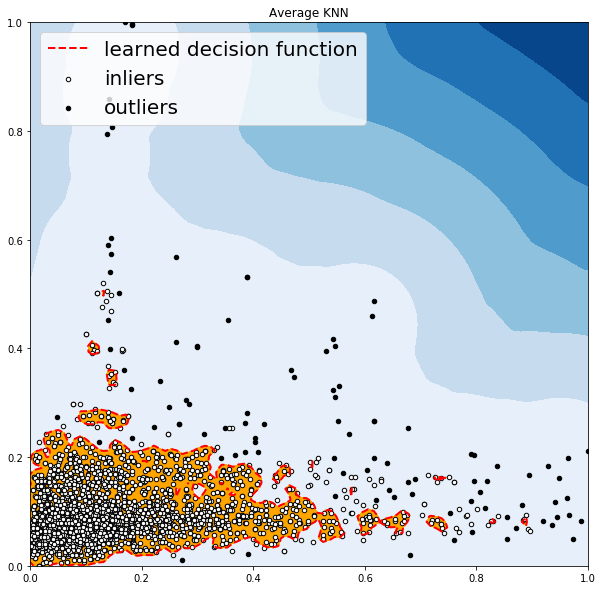



dataset wine: wine_benchmark_0955.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


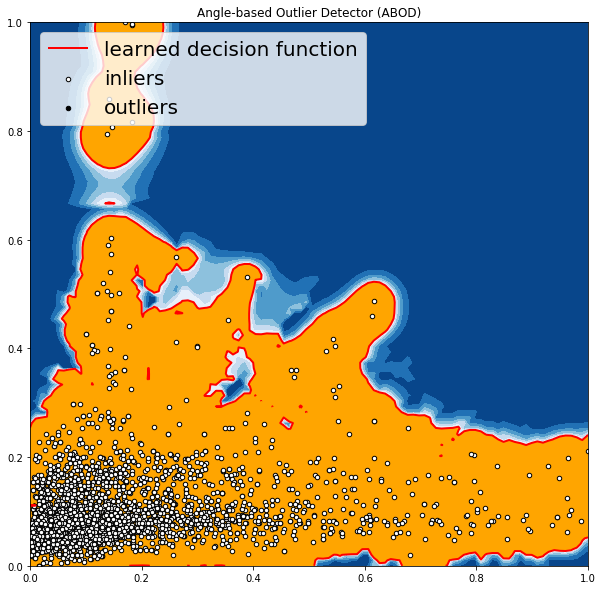

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


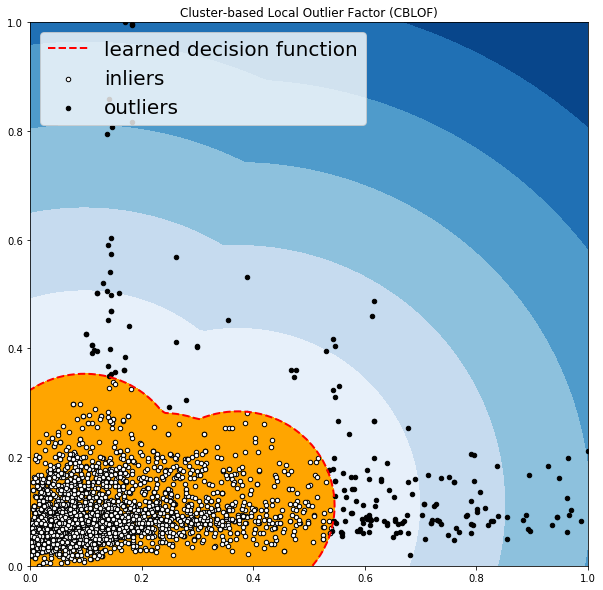

OUTLIERS :  170 INLIERS :  3569 Feature Bagging


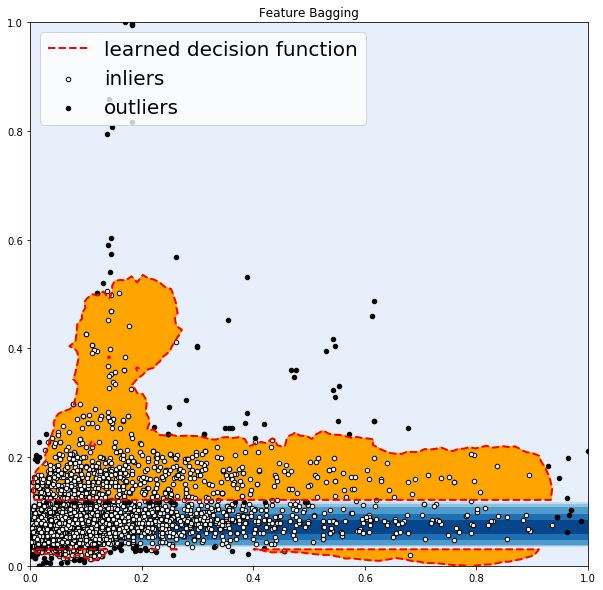

OUTLIERS :  185 INLIERS :  3554 Histogram-base Outlier Detection (HBOS)


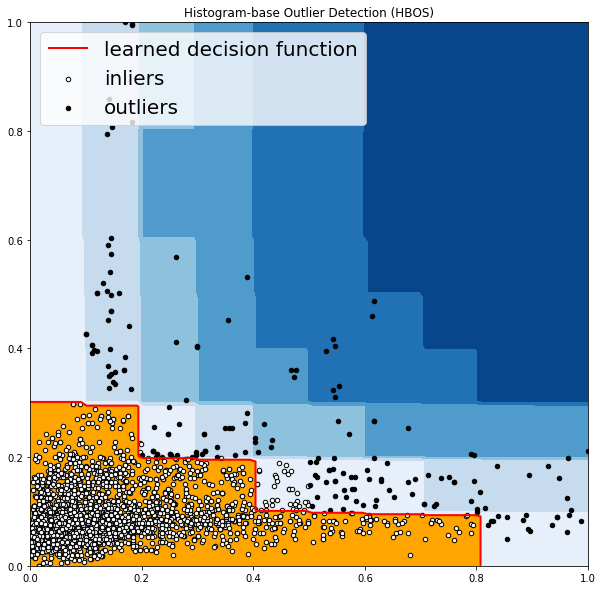

OUTLIERS :  186 INLIERS :  3553 Isolation Forest


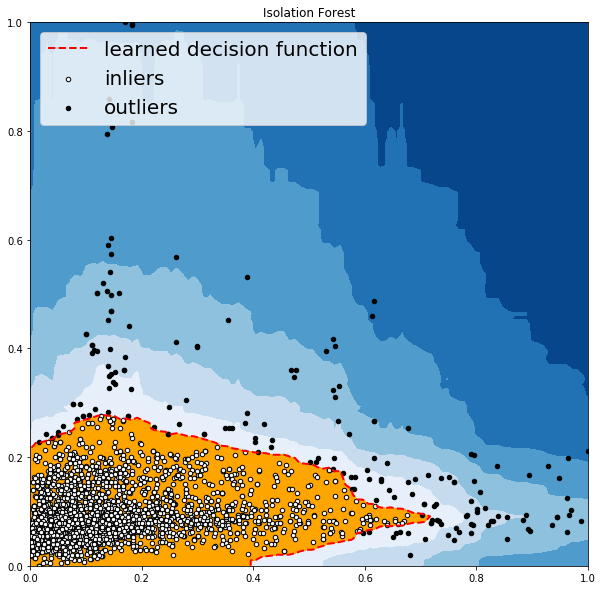

OUTLIERS :  157 INLIERS :  3582 K Nearest Neighbors (KNN)


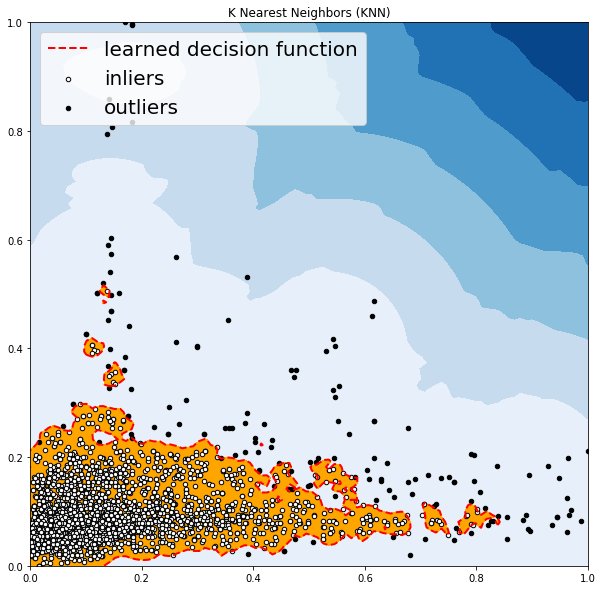

OUTLIERS :  99 INLIERS :  3640 Average KNN


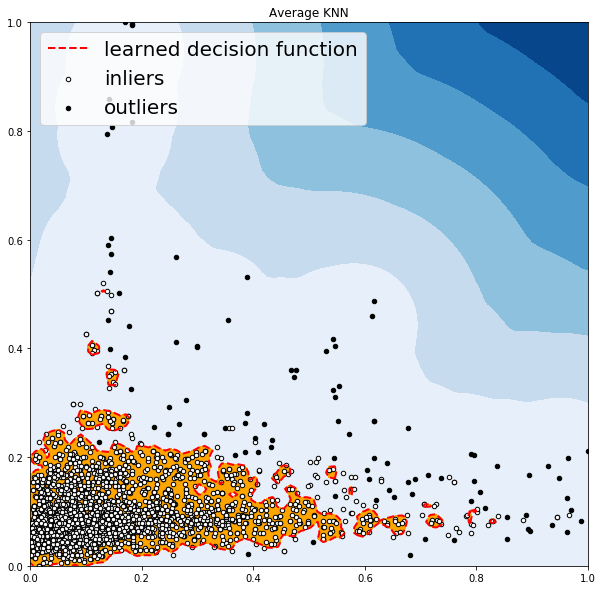

In [14]:
files = os.listdir(root)
for file in files[:2]:
    print('\n\ndataset wine:', file)
    file = root + file

    dataset = pd.read_csv(file)  
    former = attribute[0]
    latter = attribute[5]
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset[[former, latter]] = scaler.fit_transform(dataset[[former, latter]])
    dataset[[former, latter]].head()
    X1 = dataset[former].values.reshape(-1, 1)
    X2 = dataset[latter].values.reshape(-1, 1)
    X = np.concatenate((X1, X2), axis=1)

    xx, yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
    for i, (clf_name, clf) in enumerate(classifiers.items()):
        clf.fit(X)
        scores_pred = clf.decision_function(X) * -1
        y_pred = clf.predict(X)
        n_inliers = len(y_pred) - np.count_nonzero(y_pred)
        n_outliers = np.count_nonzero(y_pred == 1)
        plt.figure(figsize=(10, 10))

        dfx = dataset
        dfx['outlier'] = y_pred.tolist()
        IX1 = np.array(dfx[former][dfx['outlier'] == 0]).reshape(-1, 1)
        IX2 = np.array(dfx[latter][dfx['outlier'] == 0]).reshape(-1, 1)

        OX1 = dfx[former][dfx['outlier'] == 1].values.reshape(-1, 1)
        OX2 = dfx[latter][dfx['outlier'] == 1].values.reshape(-1, 1)

        print('OUTLIERS : ', n_outliers, 'INLIERS : ', n_inliers, clf_name)

        threshold = stats.scoreatpercentile(scores_pred, 100 * outliers_fraction)

        Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
        Z = Z.reshape(xx.shape)
        plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7), cmap=plt.cm.Blues_r)
        a = plt.contour(xx, yy, Z, levels=[threshold], linewidths=2, colors='red')
        plt.contourf(xx, yy, Z, levels=[threshold, Z.max()], colors='orange')

        b = plt.scatter(IX1, IX2, c='white', s=20, edgecolor='k')

        c = plt.scatter(OX1, OX2, c='black', s=20, edgecolor='k')

        plt.axis('tight')
        plt.legend(
            [a.collections[0], b, c],
            ['learned decision function', 'inliers', 'outliers'],
            prop=matplotlib.font_manager.FontProperties(size=20),
            loc=2)

        plt.xlim((0, 1))
        plt.ylim((0, 1))
        plt.title(clf_name)
        plt.show()

#### 结果分析

> ABOD方法

它考虑每个点与其邻居之间的关系，它没有考虑这些邻居之间的关系，其加权余弦分数与所有邻居的方差可视为偏离分数；ABOD在多维数据上表现良好；

> k-Nearest Neighbors Detector方法

对于任何数据点，到第k个最近邻居的距离可以被视为远离分数；PyOD支持三个kNN探测器：
最大：使用第k个邻居的距离作为离群值；
均值：使用所有k个邻居的平均值作为离群值得分；
中位数：使用与邻居的距离的中位数作为离群值得分；

> Isolation Forest方法

它在内部使用scikit-learn库，在此方法中，使用一组树完成数据分区； 隔离森林提供了一个异常分数，用于查看结构中点的隔离程度， 然后使用异常分数来识别来自正常观察的异常值，隔离森林在多维数据上表现良好；

> Histogram-based Outlier Detection方法

这是一种有效的无监督方法，它假设特征独立并通过构建直方图来计算异常值，它比多变量方法快得多，但代价是精度较低；

> Local Correlation Integral (LOCI)方法

LOCI对于检测异常值和异常值组非常有效，它为每个点提供LOCI图，总结了该点周围区域内数据的大量信息，确定了簇，微簇，它们的直径以及它们的簇间距离；现有的异常检测方法都不能匹配此功能，因为它们只为每个点输出一个数字；

> Feature Bagging方法

功能装袋检测器在数据集的各种子样本上安装了许多基本检测器，它使用平均或其他组合方法来提高预测精度，默认情况下，Local Outlier Factor（LOF）用作基本估算器。 但是，任何估计器都可以用作基本估计器，例如kNN和ABOD；特征装袋首先通过随机选择特征子集来构造n个子样本。 这带来了基本估计的多样性。 最后，通过平均或取所有基本检测器的最大值来生成预测分数；

### 3.6 diff.score, free.sulfur.dioxide



dataset wine: wine_benchmark_0941.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


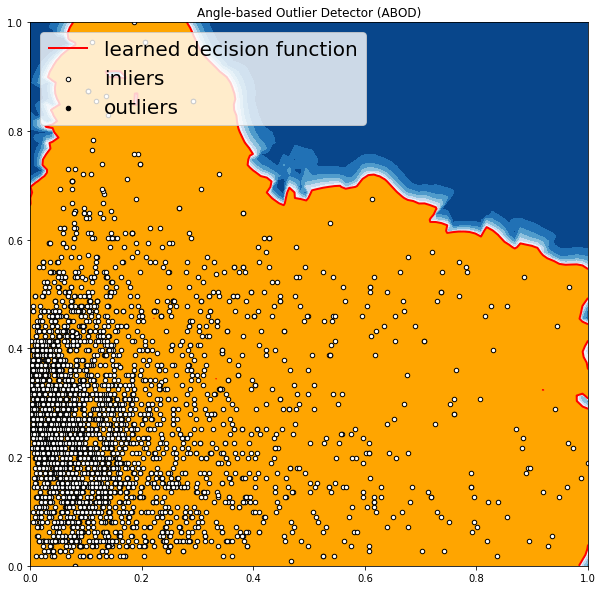

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


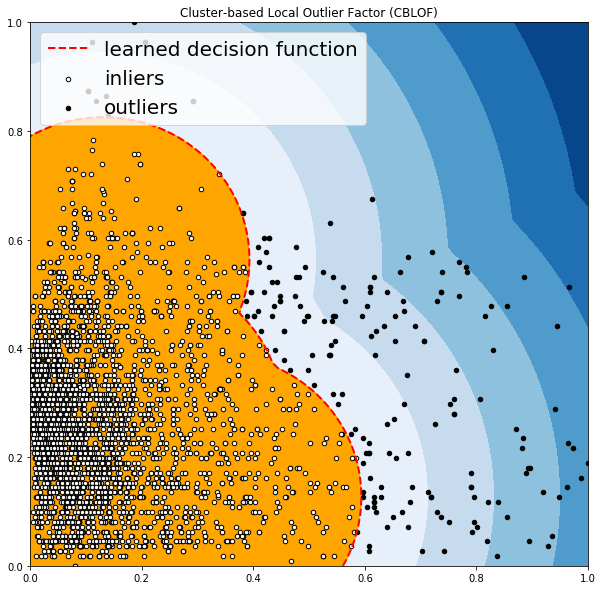

OUTLIERS :  143 INLIERS :  3596 Feature Bagging


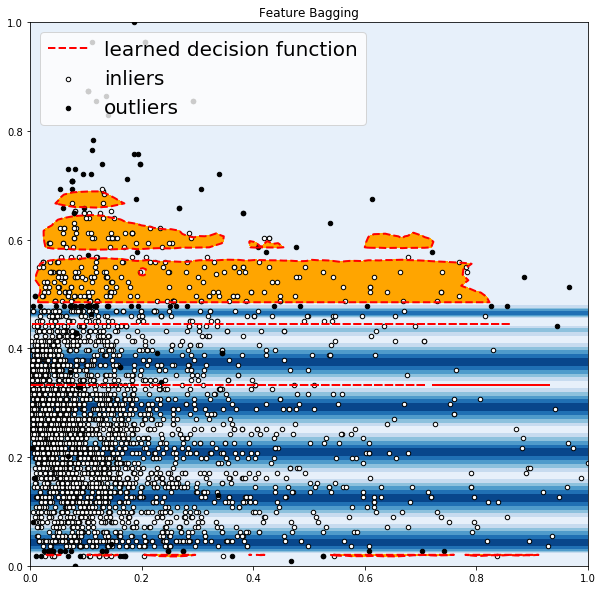

OUTLIERS :  171 INLIERS :  3568 Histogram-base Outlier Detection (HBOS)


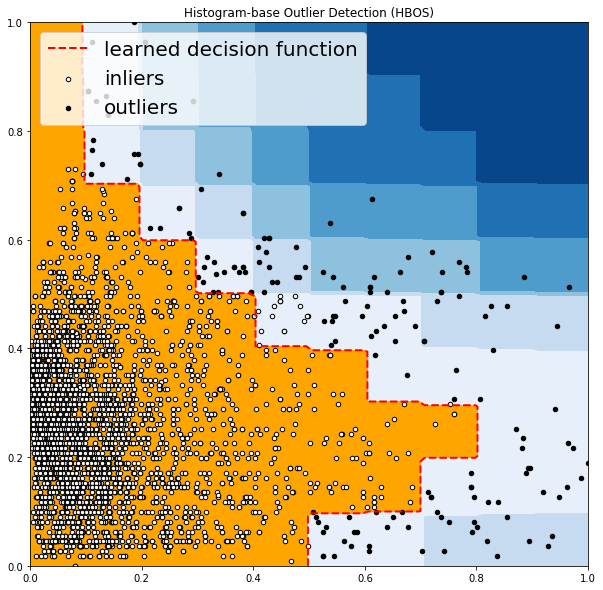

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


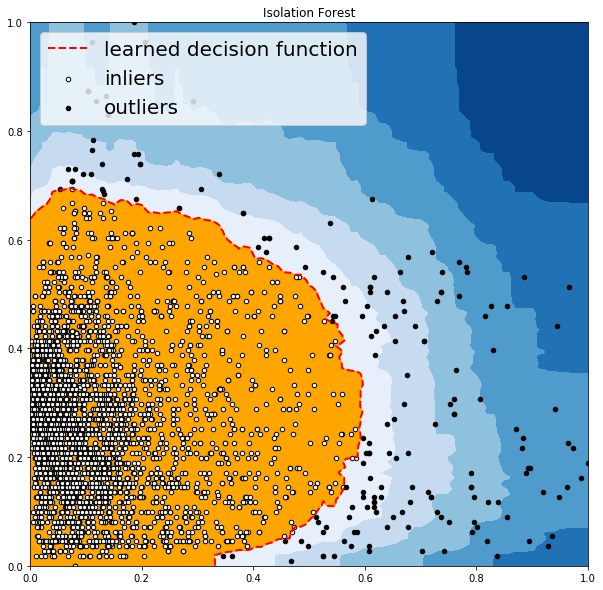

OUTLIERS :  138 INLIERS :  3601 K Nearest Neighbors (KNN)


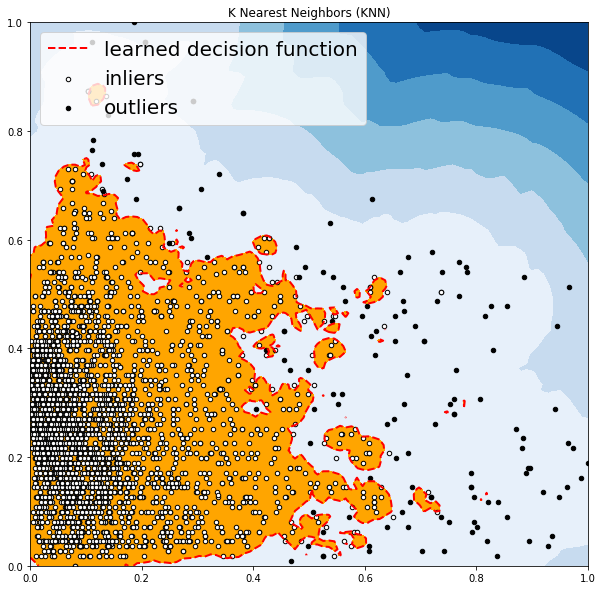

OUTLIERS :  90 INLIERS :  3649 Average KNN


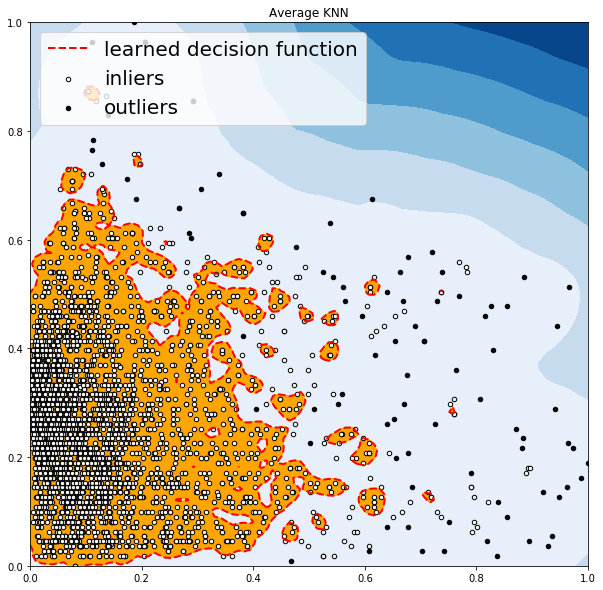



dataset wine: wine_benchmark_0955.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


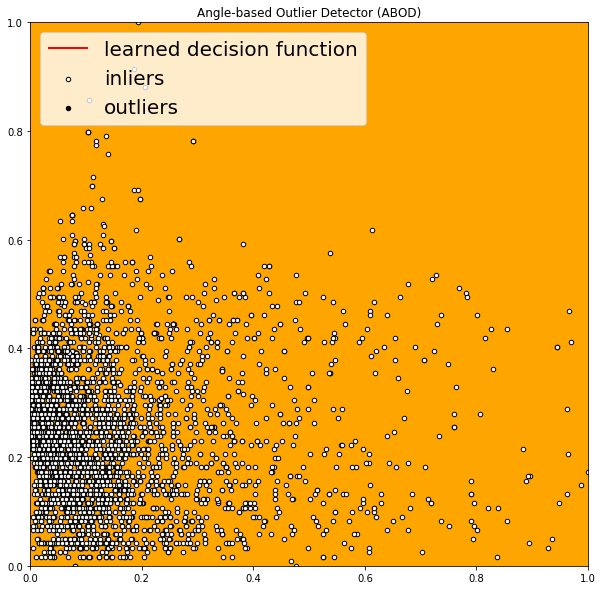

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


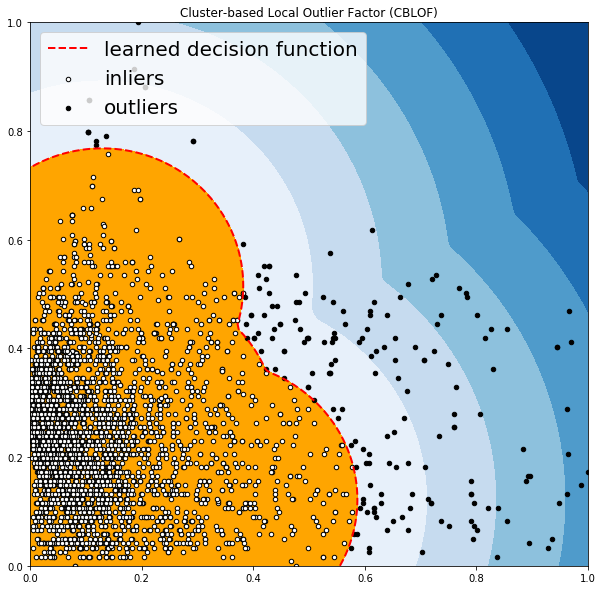

OUTLIERS :  176 INLIERS :  3563 Feature Bagging


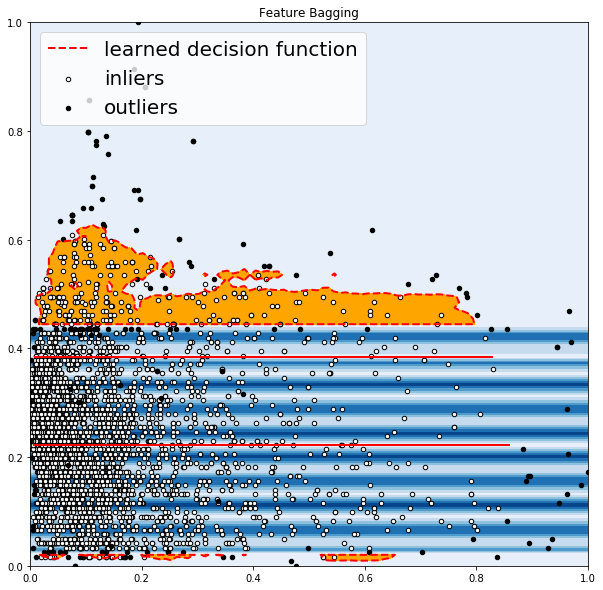

OUTLIERS :  185 INLIERS :  3554 Histogram-base Outlier Detection (HBOS)


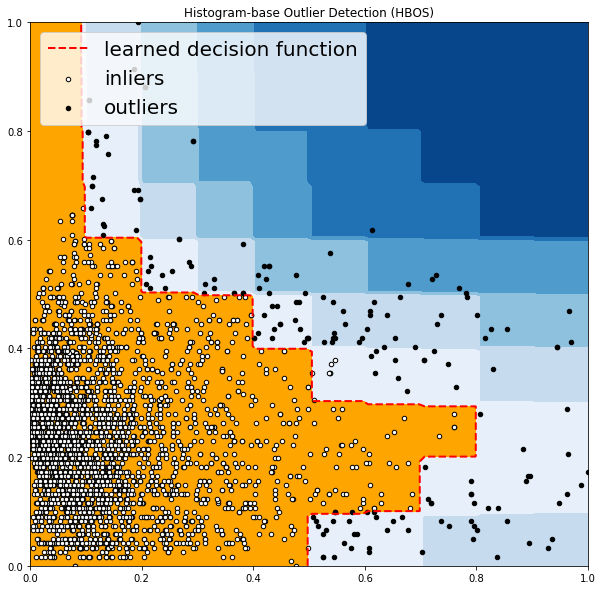

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


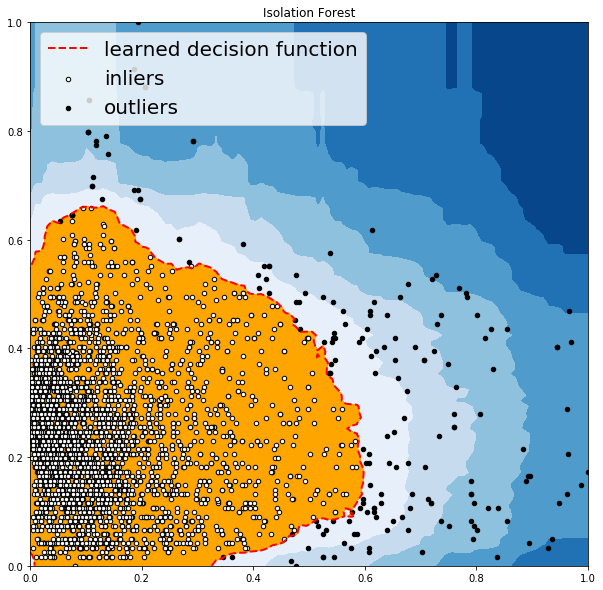

OUTLIERS :  147 INLIERS :  3592 K Nearest Neighbors (KNN)


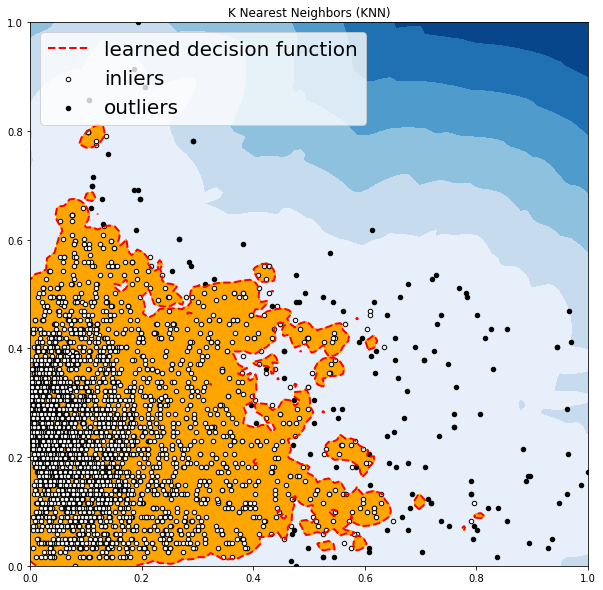

OUTLIERS :  97 INLIERS :  3642 Average KNN


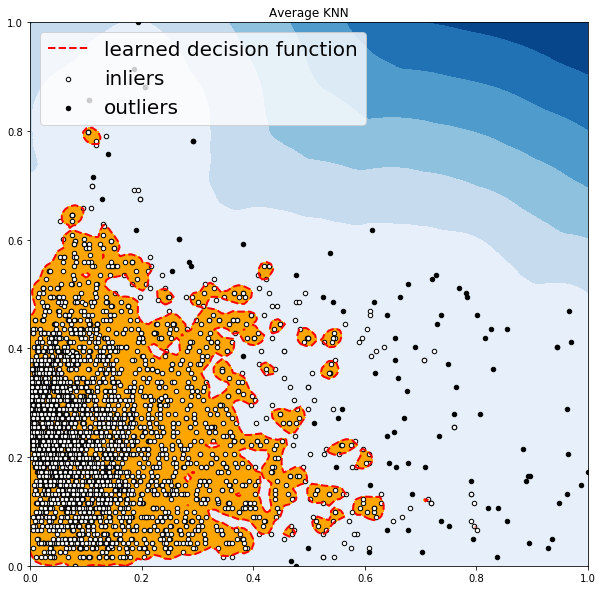

In [15]:
files = os.listdir(root)
for file in files[:2]:
    print('\n\ndataset wine:', file)
    file = root + file

    dataset = pd.read_csv(file)  
    former = attribute[0]
    latter = attribute[6]
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset[[former, latter]] = scaler.fit_transform(dataset[[former, latter]])
    dataset[[former, latter]].head()
    X1 = dataset[former].values.reshape(-1, 1)
    X2 = dataset[latter].values.reshape(-1, 1)
    X = np.concatenate((X1, X2), axis=1)

    xx, yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
    for i, (clf_name, clf) in enumerate(classifiers.items()):
        clf.fit(X)
        scores_pred = clf.decision_function(X) * -1
        y_pred = clf.predict(X)
        n_inliers = len(y_pred) - np.count_nonzero(y_pred)
        n_outliers = np.count_nonzero(y_pred == 1)
        plt.figure(figsize=(10, 10))
        dfx = dataset
        dfx['outlier'] = y_pred.tolist()

        IX1 = np.array(dfx[former][dfx['outlier'] == 0]).reshape(-1, 1)
        IX2 = np.array(dfx[latter][dfx['outlier'] == 0]).reshape(-1, 1)
        OX1 = dfx[former][dfx['outlier'] == 1].values.reshape(-1, 1)
        OX2 = dfx[latter][dfx['outlier'] == 1].values.reshape(-1, 1)

        print('OUTLIERS : ', n_outliers, 'INLIERS : ', n_inliers, clf_name)
        threshold = stats.scoreatpercentile(scores_pred, 100 * outliers_fraction)

        Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
        Z = Z.reshape(xx.shape)
        plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7), cmap=plt.cm.Blues_r)
        a = plt.contour(xx, yy, Z, levels=[threshold], linewidths=2, colors='red')
        plt.contourf(xx, yy, Z, levels=[threshold, Z.max()], colors='orange')
        b = plt.scatter(IX1, IX2, c='white', s=20, edgecolor='k')
        c = plt.scatter(OX1, OX2, c='black', s=20, edgecolor='k')

        plt.axis('tight')

        plt.legend(
            [a.collections[0], b, c],
            ['learned decision function', 'inliers', 'outliers'],
            prop=matplotlib.font_manager.FontProperties(size=20),
            loc=2)

        plt.xlim((0, 1))
        plt.ylim((0, 1))
        plt.title(clf_name)
        plt.show()

#### 结果分析

> ABOD方法

它考虑每个点与其邻居之间的关系，它没有考虑这些邻居之间的关系，其加权余弦分数与所有邻居的方差可视为偏离分数；ABOD在多维数据上表现良好；

> k-Nearest Neighbors Detector方法

对于任何数据点，到第k个最近邻居的距离可以被视为远离分数；PyOD支持三个kNN探测器：
最大：使用第k个邻居的距离作为离群值；
均值：使用所有k个邻居的平均值作为离群值得分；
中位数：使用与邻居的距离的中位数作为离群值得分；

> Isolation Forest方法

它在内部使用scikit-learn库，在此方法中，使用一组树完成数据分区； 隔离森林提供了一个异常分数，用于查看结构中点的隔离程度， 然后使用异常分数来识别来自正常观察的异常值，隔离森林在多维数据上表现良好；

> Histogram-based Outlier Detection方法

这是一种有效的无监督方法，它假设特征独立并通过构建直方图来计算异常值，它比多变量方法快得多，但代价是精度较低；

> Local Correlation Integral (LOCI)方法

LOCI对于检测异常值和异常值组非常有效，它为每个点提供LOCI图，总结了该点周围区域内数据的大量信息，确定了簇，微簇，它们的直径以及它们的簇间距离；现有的异常检测方法都不能匹配此功能，因为它们只为每个点输出一个数字；

> Feature Bagging方法

功能装袋检测器在数据集的各种子样本上安装了许多基本检测器，它使用平均或其他组合方法来提高预测精度，默认情况下，Local Outlier Factor（LOF）用作基本估算器。 但是，任何估计器都可以用作基本估计器，例如kNN和ABOD；特征装袋首先通过随机选择特征子集来构造n个子样本。 这带来了基本估计的多样性。 最后，通过平均或取所有基本检测器的最大值来生成预测分数；

> Clustering Based Local Outlier Factor方法

它将数据分为小型集群和大型集群，然后根据点所属的簇的大小以及到最近的大簇的距离来计算异常分数

### 3.7 diff.score, total.sulfur.dioxide



dataset wine: wine_benchmark_0941.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


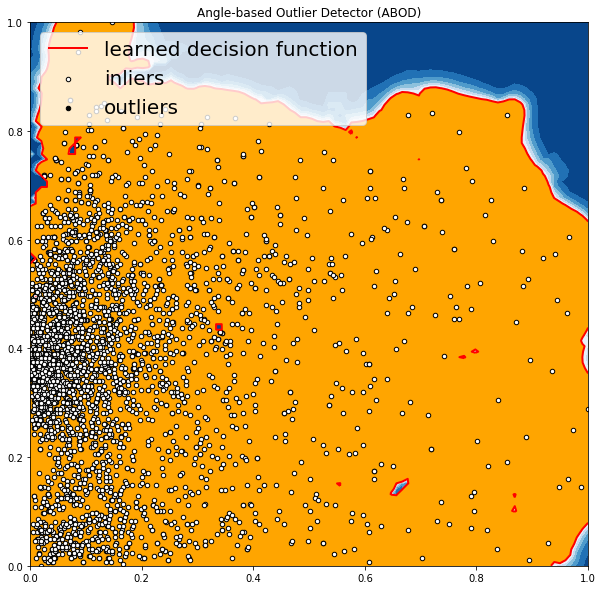

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


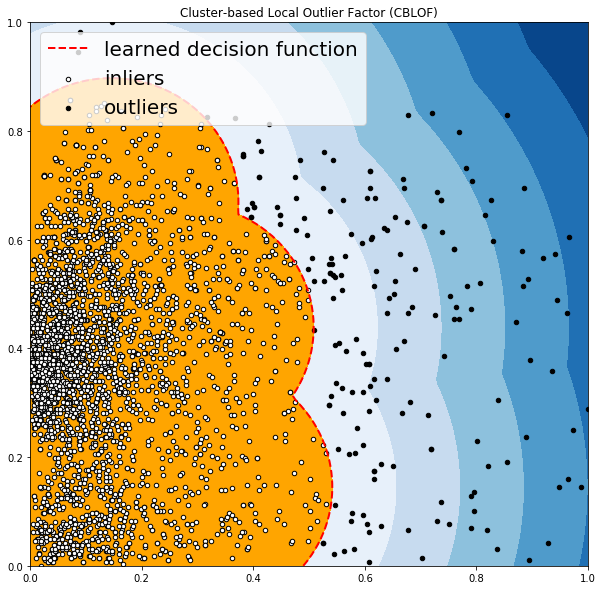

OUTLIERS :  175 INLIERS :  3564 Feature Bagging


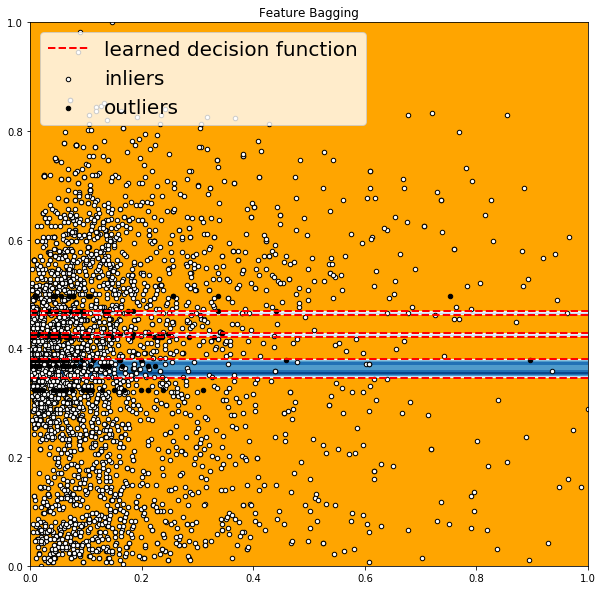

OUTLIERS :  178 INLIERS :  3561 Histogram-base Outlier Detection (HBOS)


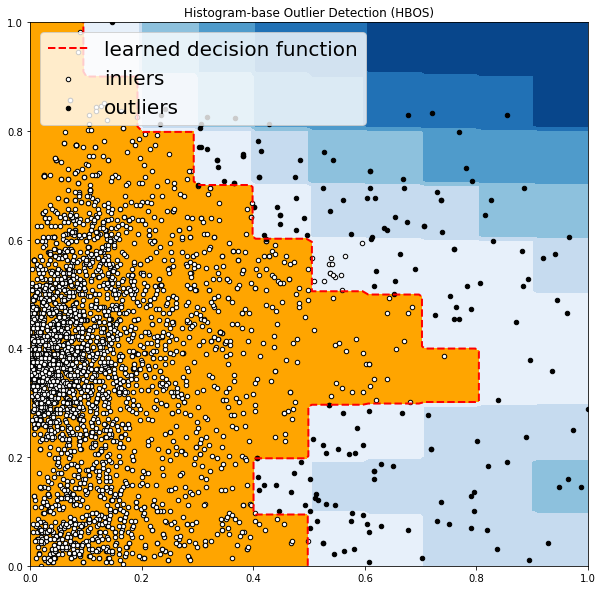

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


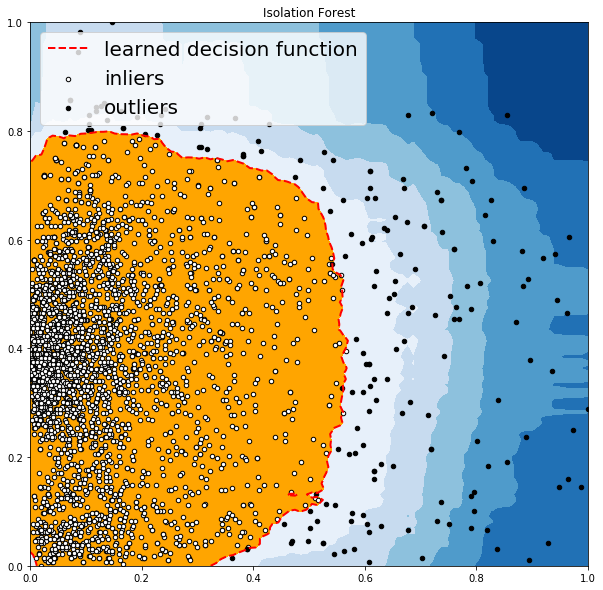

OUTLIERS :  136 INLIERS :  3603 K Nearest Neighbors (KNN)


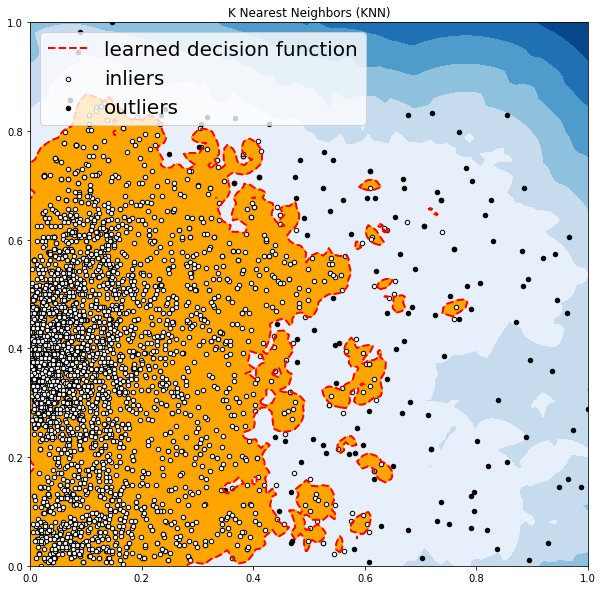

OUTLIERS :  99 INLIERS :  3640 Average KNN


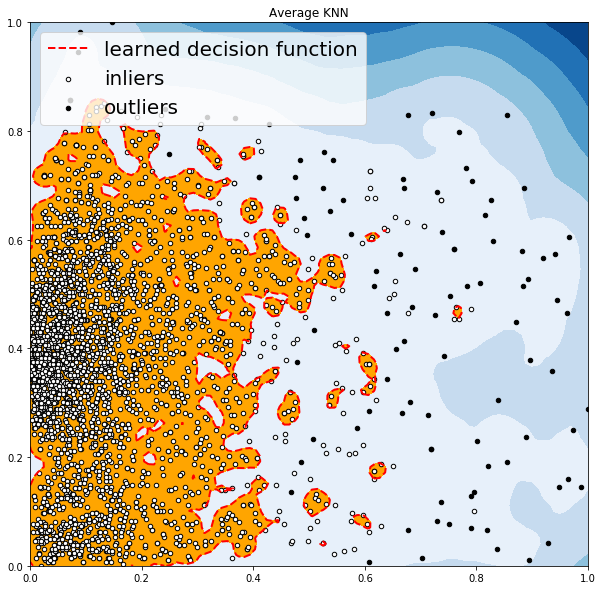



dataset wine: wine_benchmark_0955.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


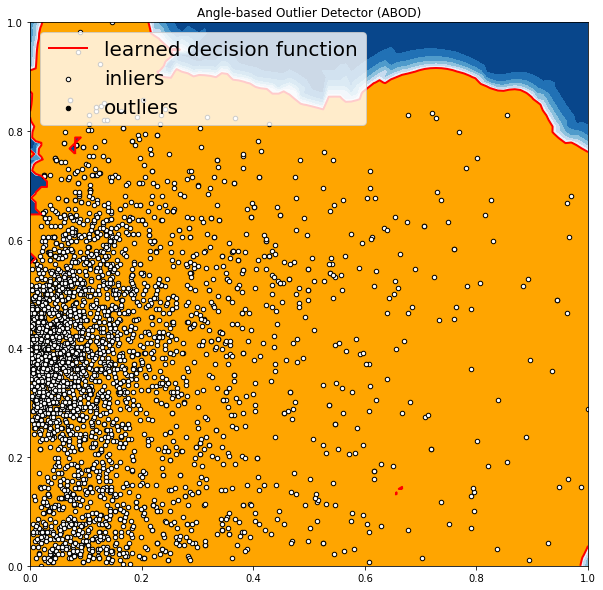

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


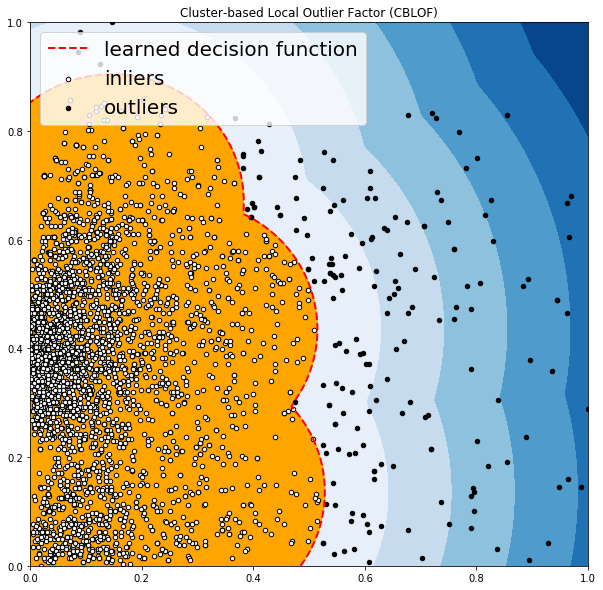

OUTLIERS :  142 INLIERS :  3597 Feature Bagging


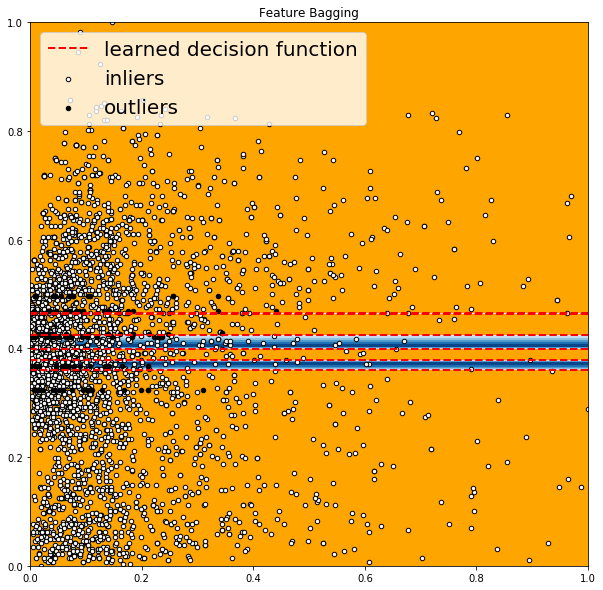

OUTLIERS :  175 INLIERS :  3564 Histogram-base Outlier Detection (HBOS)


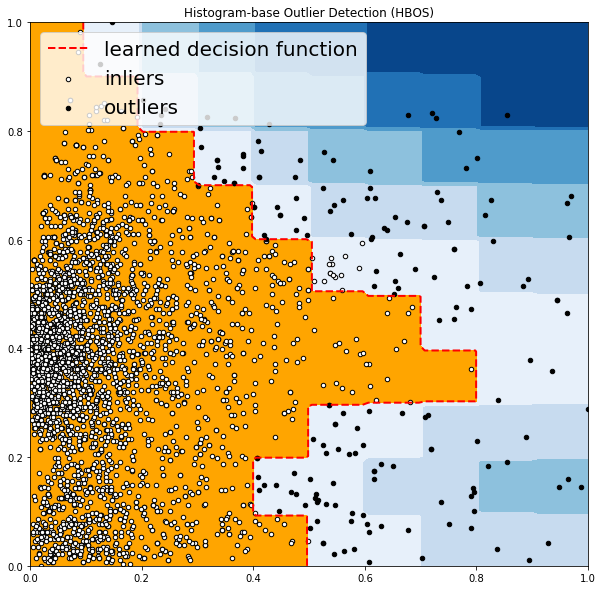

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


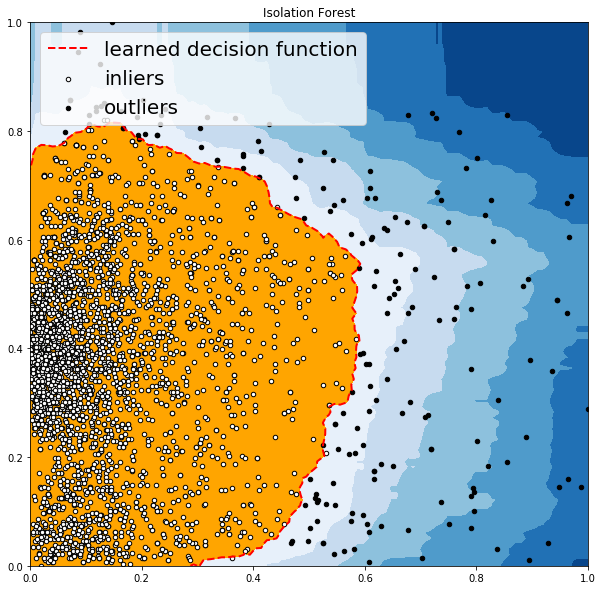

OUTLIERS :  153 INLIERS :  3586 K Nearest Neighbors (KNN)


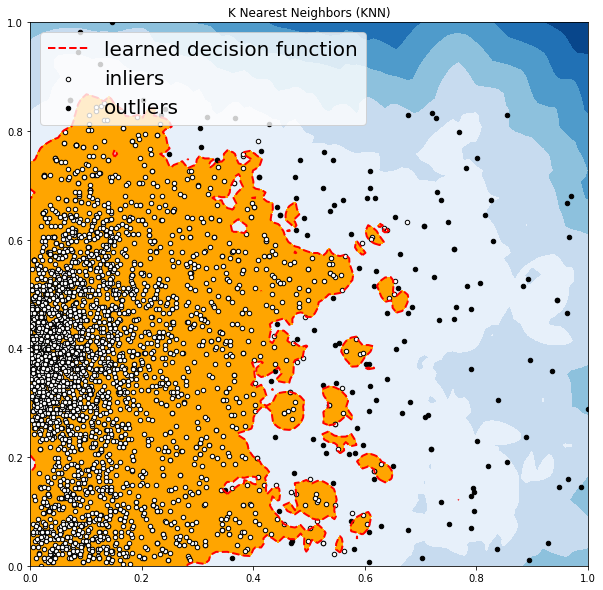

OUTLIERS :  97 INLIERS :  3642 Average KNN


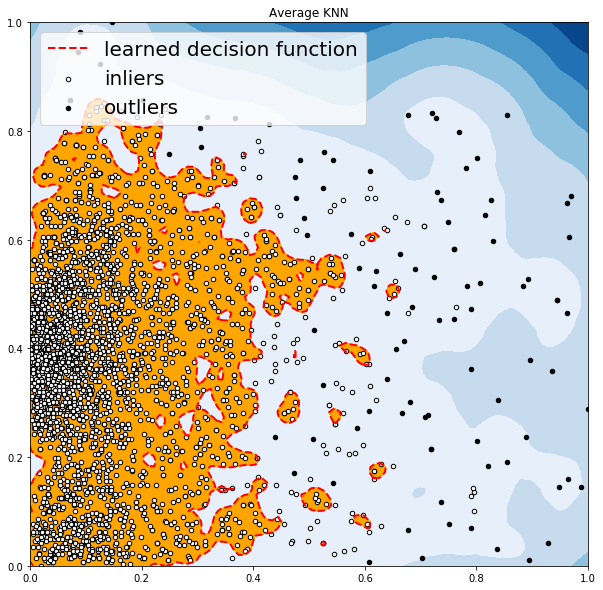

In [16]:
files = os.listdir(root)
for file in files[:2]:
    print('\n\ndataset wine:', file)
    file = root + file

    dataset = pd.read_csv(file)  
    former = attribute[0]
    latter = attribute[7]
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset[[former, latter]] = scaler.fit_transform(dataset[[former, latter]])
    dataset[[former, latter]].head()
    X1 = dataset[former].values.reshape(-1, 1)
    X2 = dataset[latter].values.reshape(-1, 1)
    X = np.concatenate((X1, X2), axis=1)
    xx, yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
    for i, (clf_name, clf) in enumerate(classifiers.items()):
        clf.fit(X)
        scores_pred = clf.decision_function(X) * -1

        y_pred = clf.predict(X)
        n_inliers = len(y_pred) - np.count_nonzero(y_pred)
        n_outliers = np.count_nonzero(y_pred == 1)
        plt.figure(figsize=(10, 10))

        dfx = dataset
        dfx['outlier'] = y_pred.tolist()
        IX1 = np.array(dfx[former][dfx['outlier'] == 0]).reshape(-1, 1)
        IX2 = np.array(dfx[latter][dfx['outlier'] == 0]).reshape(-1, 1)
        OX1 = dfx[former][dfx['outlier'] == 1].values.reshape(-1, 1)
        OX2 = dfx[latter][dfx['outlier'] == 1].values.reshape(-1, 1)

        print('OUTLIERS : ', n_outliers, 'INLIERS : ', n_inliers, clf_name)
        threshold = stats.scoreatpercentile(scores_pred, 100 * outliers_fraction)

        Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
        Z = Z.reshape(xx.shape)
        plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7), cmap=plt.cm.Blues_r)

        a = plt.contour(xx, yy, Z, levels=[threshold], linewidths=2, colors='red')
        plt.contourf(xx, yy, Z, levels=[threshold, Z.max()], colors='orange')

        b = plt.scatter(IX1, IX2, c='white', s=20, edgecolor='k')

        c = plt.scatter(OX1, OX2, c='black', s=20, edgecolor='k')
        plt.axis('tight')
        plt.legend(
            [a.collections[0], b, c],
            ['learned decision function', 'inliers', 'outliers'],
            prop=matplotlib.font_manager.FontProperties(size=20),
            loc=2)

        plt.xlim((0, 1))
        plt.ylim((0, 1))
        plt.title(clf_name)
        plt.show()

#### 结果分析

> ABOD方法

它考虑每个点与其邻居之间的关系，它没有考虑这些邻居之间的关系，其加权余弦分数与所有邻居的方差可视为偏离分数；ABOD在多维数据上表现良好；

> k-Nearest Neighbors Detector方法

对于任何数据点，到第k个最近邻居的距离可以被视为远离分数；PyOD支持三个kNN探测器：
最大：使用第k个邻居的距离作为离群值；
均值：使用所有k个邻居的平均值作为离群值得分；
中位数：使用与邻居的距离的中位数作为离群值得分；

> Isolation Forest方法

它在内部使用scikit-learn库，在此方法中，使用一组树完成数据分区； 隔离森林提供了一个异常分数，用于查看结构中点的隔离程度， 然后使用异常分数来识别来自正常观察的异常值，隔离森林在多维数据上表现良好；

> Histogram-based Outlier Detection方法

这是一种有效的无监督方法，它假设特征独立并通过构建直方图来计算异常值，它比多变量方法快得多，但代价是精度较低；

> Local Correlation Integral (LOCI)方法

LOCI对于检测异常值和异常值组非常有效，它为每个点提供LOCI图，总结了该点周围区域内数据的大量信息，确定了簇，微簇，它们的直径以及它们的簇间距离；现有的异常检测方法都不能匹配此功能，因为它们只为每个点输出一个数字；

> Feature Bagging方法

功能装袋检测器在数据集的各种子样本上安装了许多基本检测器，它使用平均或其他组合方法来提高预测精度，默认情况下，Local Outlier Factor（LOF）用作基本估算器。 但是，任何估计器都可以用作基本估计器，例如kNN和ABOD；特征装袋首先通过随机选择特征子集来构造n个子样本。 这带来了基本估计的多样性。 最后，通过平均或取所有基本检测器的最大值来生成预测分数；

> Clustering Based Local Outlier Factor方法

它将数据分为小型集群和大型集群，然后根据点所属的簇的大小以及到最近的大簇的距离来计算异常分数

### 3.8 diff.score, density



dataset wine: wine_benchmark_0941.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


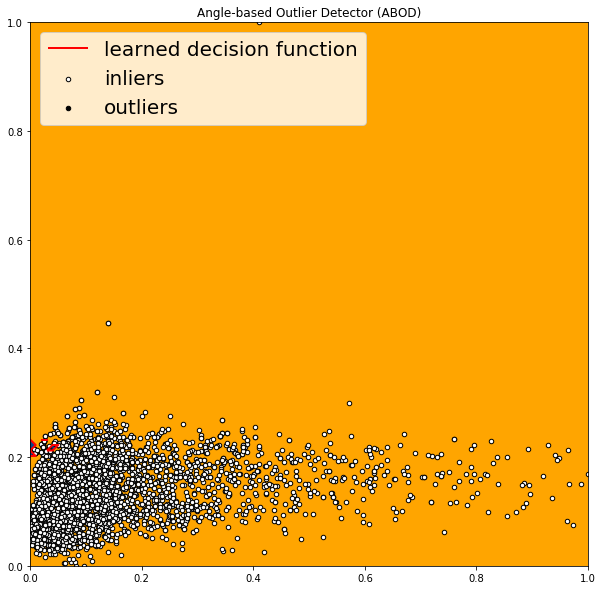

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


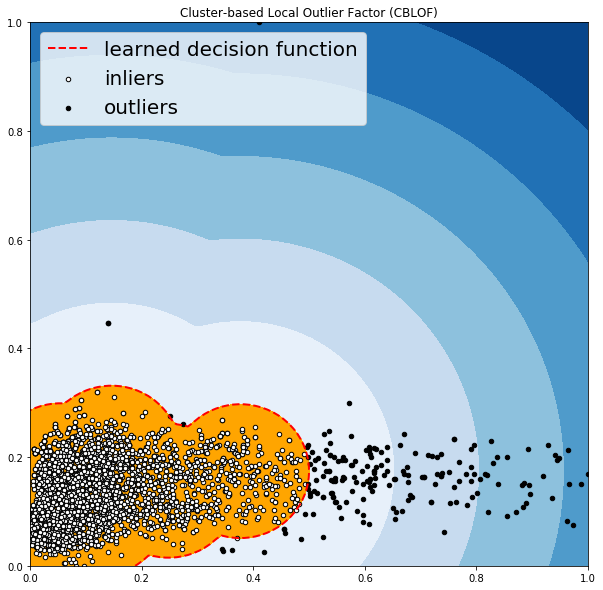

OUTLIERS :  174 INLIERS :  3565 Feature Bagging


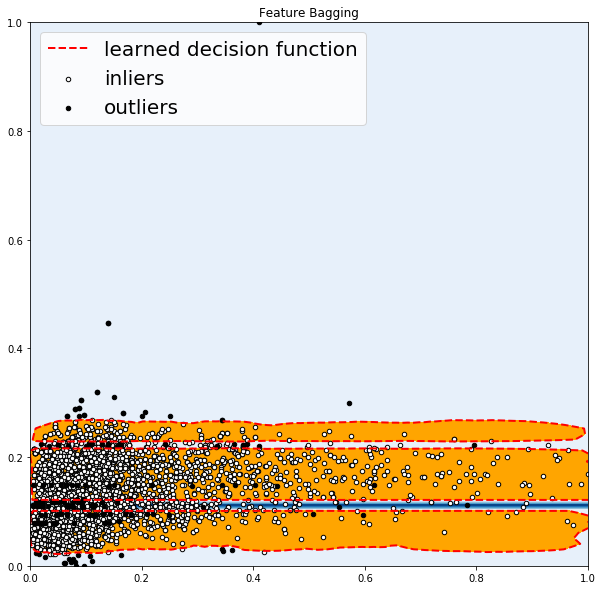

OUTLIERS :  183 INLIERS :  3556 Histogram-base Outlier Detection (HBOS)


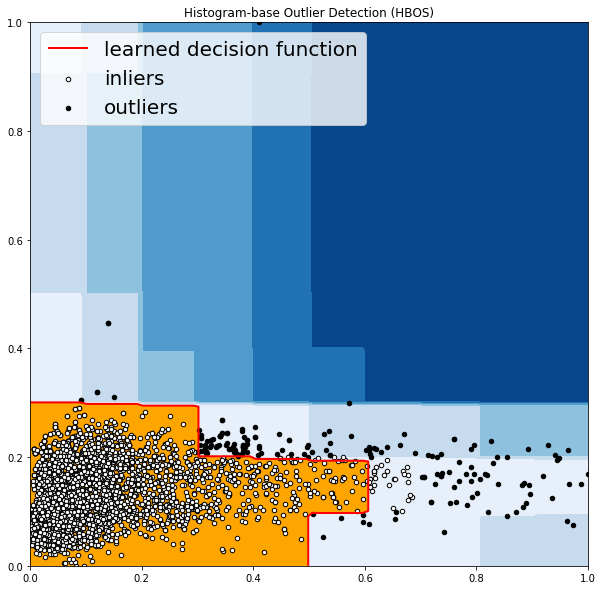

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


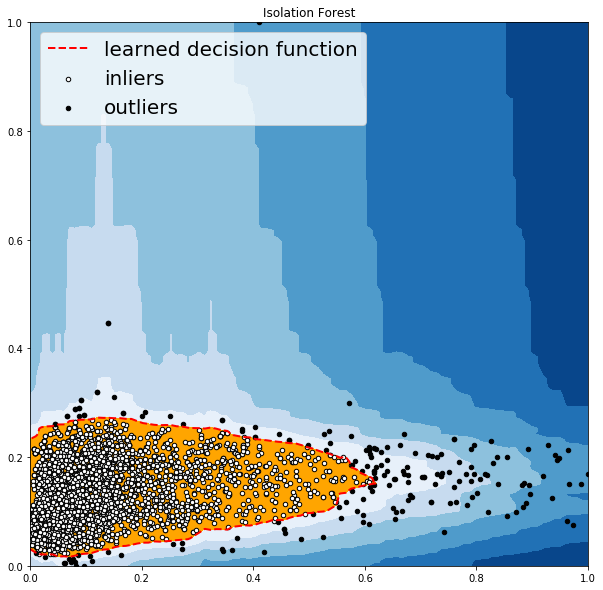

OUTLIERS :  154 INLIERS :  3585 K Nearest Neighbors (KNN)


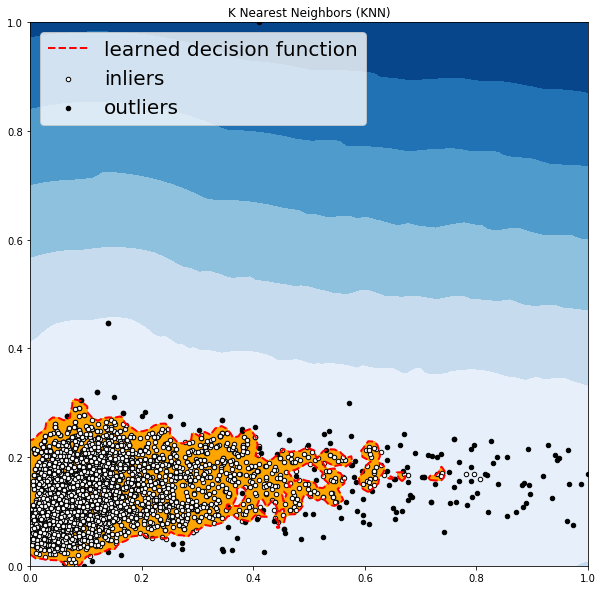

OUTLIERS :  104 INLIERS :  3635 Average KNN


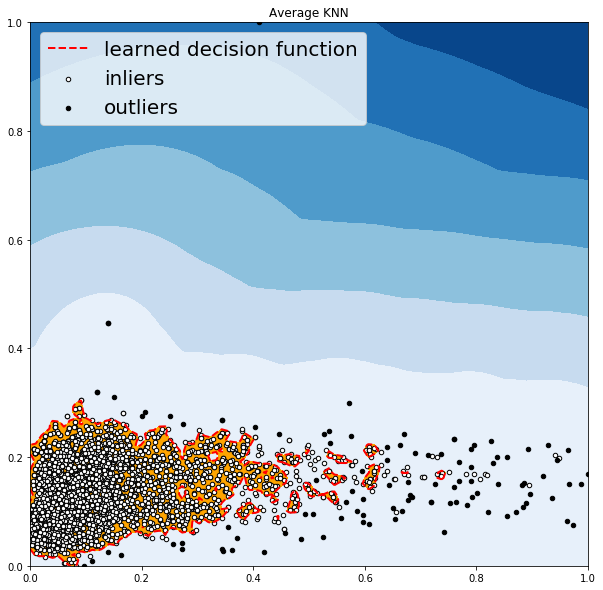



dataset wine: wine_benchmark_0955.csv
OUTLIERS :  0 INLIERS :  3739 Angle-based Outlier Detector (ABOD)


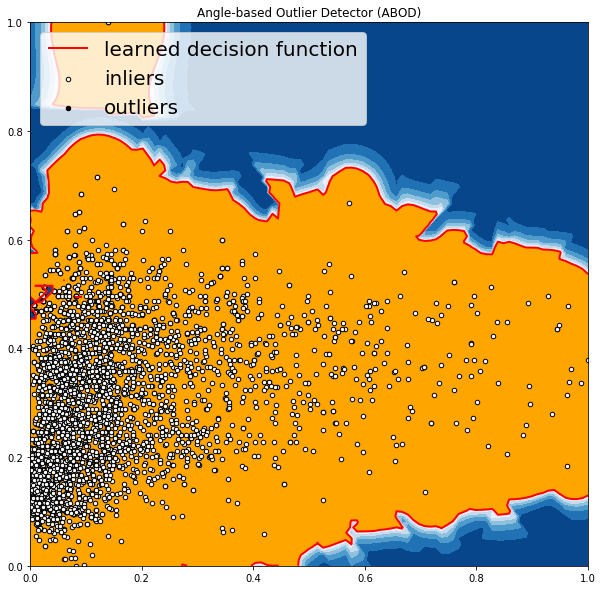

OUTLIERS :  187 INLIERS :  3552 Cluster-based Local Outlier Factor (CBLOF)


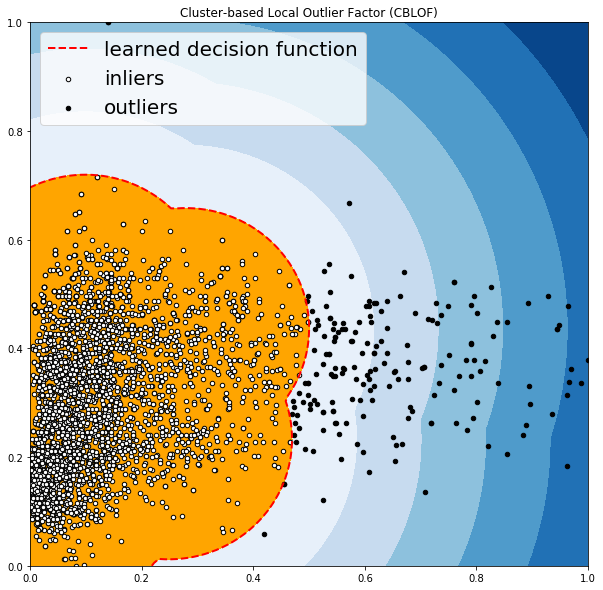

OUTLIERS :  181 INLIERS :  3558 Feature Bagging


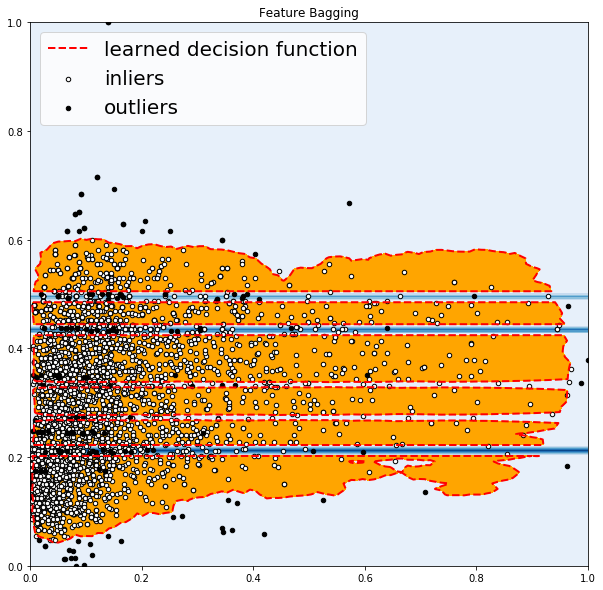

OUTLIERS :  170 INLIERS :  3569 Histogram-base Outlier Detection (HBOS)


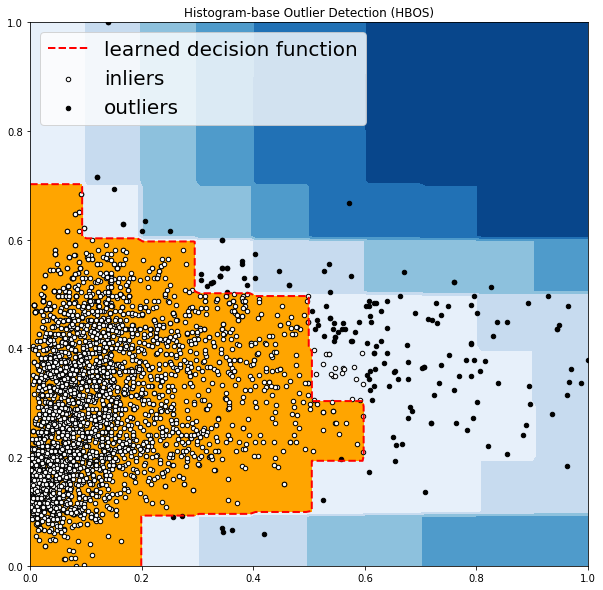

OUTLIERS :  187 INLIERS :  3552 Isolation Forest


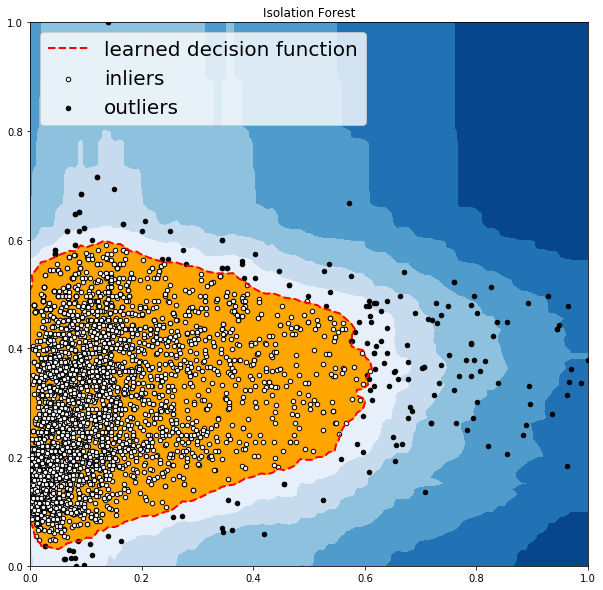

OUTLIERS :  160 INLIERS :  3579 K Nearest Neighbors (KNN)


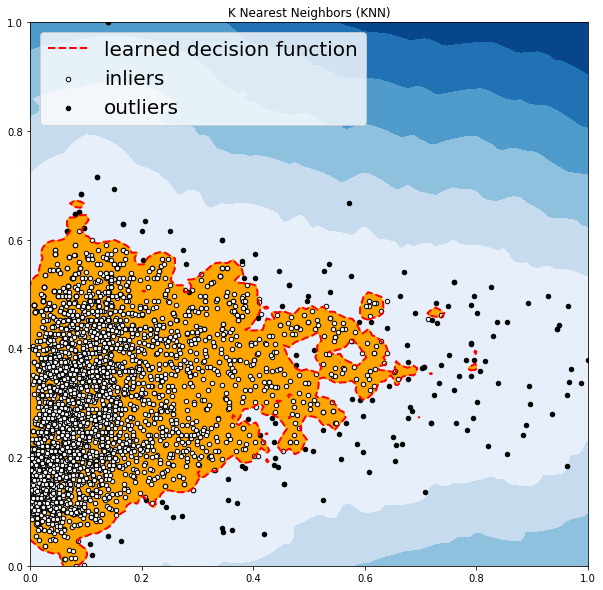

OUTLIERS :  117 INLIERS :  3622 Average KNN


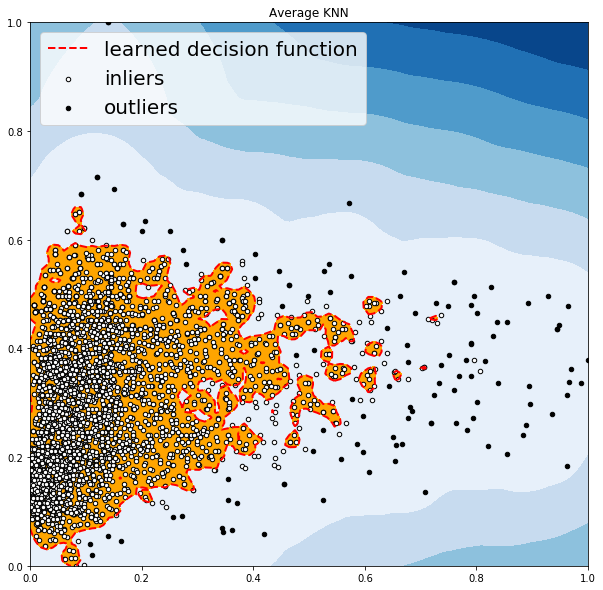

In [17]:
files = os.listdir(root)
for file in files[:2]:
    print('\n\ndataset wine:', file)
    file = root + file

    dataset = pd.read_csv(file)  
    former = attribute[0]
    latter = attribute[8]
    scaler = MinMaxScaler(feature_range=(0, 1))
    dataset[[former, latter]] = scaler.fit_transform(dataset[[former, latter]])
    dataset[[former, latter]].head()
    X1 = dataset[former].values.reshape(-1, 1)
    X2 = dataset[latter].values.reshape(-1, 1)
    X = np.concatenate((X1, X2), axis=1)

    xx, yy = np.meshgrid(np.linspace(0, 1, 100), np.linspace(0, 1, 100))
    for i, (clf_name, clf) in enumerate(classifiers.items()):
        clf.fit(X)
        scores_pred = clf.decision_function(X) * -1

        y_pred = clf.predict(X)
        n_inliers = len(y_pred) - np.count_nonzero(y_pred)
        n_outliers = np.count_nonzero(y_pred == 1)
        plt.figure(figsize=(10, 10))
        dfx = dataset
        dfx['outlier'] = y_pred.tolist()

        IX1 = np.array(dfx[former][dfx['outlier'] == 0]).reshape(-1, 1)
        IX2 = np.array(dfx[latter][dfx['outlier'] == 0]).reshape(-1, 1)
        OX1 = dfx[former][dfx['outlier'] == 1].values.reshape(-1, 1)
        OX2 = dfx[latter][dfx['outlier'] == 1].values.reshape(-1, 1)

        print('OUTLIERS : ', n_outliers, 'INLIERS : ', n_inliers, clf_name)
        threshold = stats.scoreatpercentile(scores_pred, 100 * outliers_fraction)
        Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]) * -1
        Z = Z.reshape(xx.shape)
        plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7), cmap=plt.cm.Blues_r)
        a = plt.contour(xx, yy, Z, levels=[threshold], linewidths=2, colors='red')
        plt.contourf(xx, yy, Z, levels=[threshold, Z.max()], colors='orange')
        b = plt.scatter(IX1, IX2, c='white', s=20, edgecolor='k')

        c = plt.scatter(OX1, OX2, c='black', s=20, edgecolor='k')

        plt.axis('tight')
        plt.legend(
            [a.collections[0], b, c],
            ['learned decision function', 'inliers', 'outliers'],
            prop=matplotlib.font_manager.FontProperties(size=20),
            loc=2)

        plt.xlim((0, 1))
        plt.ylim((0, 1))
        plt.title(clf_name)
        plt.show()

#### 结果分析

> ABOD方法

它考虑每个点与其邻居之间的关系，它没有考虑这些邻居之间的关系，其加权余弦分数与所有邻居的方差可视为偏离分数；ABOD在多维数据上表现良好；

> k-Nearest Neighbors Detector方法

对于任何数据点，到第k个最近邻居的距离可以被视为远离分数；PyOD支持三个kNN探测器：
最大：使用第k个邻居的距离作为离群值；
均值：使用所有k个邻居的平均值作为离群值得分；
中位数：使用与邻居的距离的中位数作为离群值得分；

> Isolation Forest方法

它在内部使用scikit-learn库，在此方法中，使用一组树完成数据分区； 隔离森林提供了一个异常分数，用于查看结构中点的隔离程度， 然后使用异常分数来识别来自正常观察的异常值，隔离森林在多维数据上表现良好；

> Histogram-based Outlier Detection方法

这是一种有效的无监督方法，它假设特征独立并通过构建直方图来计算异常值，它比多变量方法快得多，但代价是精度较低；

> Local Correlation Integral (LOCI)方法

LOCI对于检测异常值和异常值组非常有效，它为每个点提供LOCI图，总结了该点周围区域内数据的大量信息，确定了簇，微簇，它们的直径以及它们的簇间距离；现有的异常检测方法都不能匹配此功能，因为它们只为每个点输出一个数字；

> Feature Bagging方法

功能装袋检测器在数据集的各种子样本上安装了许多基本检测器，它使用平均或其他组合方法来提高预测精度，默认情况下，Local Outlier Factor（LOF）用作基本估算器。 但是，任何估计器都可以用作基本估计器，例如kNN和ABOD；特征装袋首先通过随机选择特征子集来构造n个子样本。 这带来了基本估计的多样性。 最后，通过平均或取所有基本检测器的最大值来生成预测分数；